In [1]:
# import required documents

import random
import requests
from bs4 import BeautifulSoup
from collections import Counter
import pandas as pd
from cryptocmd import CmcScraper
import numpy as np
import seaborn as sns
import datetime as dt
import warnings
warnings.filterwarnings('ignore')
import os
import math
import matplotlib.pyplot as plt
import pickle

# Machine Learning
from sklearn.model_selection import train_test_split
from sklearn.metrics import mean_squared_error, mean_absolute_error, explained_variance_score, r2_score
from sklearn.metrics import mean_poisson_deviance, mean_gamma_deviance, accuracy_score
from sklearn.preprocessing import MinMaxScaler
from sklearn.ensemble import RandomForestClassifier, RandomForestRegressor
from sklearn.svm import SVC, SVR

# Deep Learning
import tensorflow as tf
from tensorflow.keras.callbacks import EarlyStopping
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, Dropout, LSTM, GRU, Bidirectional

# Statistical Tests and visulizations
from itertools import product
import statsmodels.api as sm

from itertools import cycle
import plotly.offline as py
import plotly.graph_objects as go
import plotly.express as px
from plotly.subplots import make_subplots

In [3]:
cryptos = {
    "BTC": "bitcoin", "ETH": "ethereum", "BNB": "binancecoin", "ADA": "cardano", "SOL": "solana",
    "XRP": "ripple", "LTC": "litecoin", "LINK": "chainlink", "DOGE": "dogecoin", "SHIB": "shiba-inu",
    "MANA": "decentraland", "VET": "vechain", "XMR": "monero", "BCH": "bitcoin-cash", "AVAX": "avalanche",
    "TRX": "tron", "MATIC": "polygon", "CRO": "cronos", "RNDR": "render", "XTZ": "tezos",
    "BAT": "basic-attention-token", "SC": "siacoin", "FTM": "fantom", "DCR": "decred", "MKR": "maker",
    "ATOM": "cosmos", "STX": "stacks", "XLM": "stellar", "QNT": "quant", "NEO": "neo"
}

In [ ]:
# List of cryptocurrency symbols 
cryptos = ["BTC", "ETH", "BNB", "ADA", "SOL", "XRP", "LTC","LINK", "DOGE", "SHIB", 
            "MANA", "VET", "XMR", "BCH", "AVAX", "TRX", "MATIC", "CRO", "RNDR", "XTZ", 
            "BAT", "SC", "FTM","DCR","MKR", "ATOM","STX", "XLM", "QNT", "NEO"]

# Initialize a list to hold DataFrames
crypto_data = []

# Downloading data
for crypto in cryptos:
    scraper = CmcScraper(crypto, '03-01-2009', '19-05-2024')
    data = scraper.get_dataframe()
    # Add a column for the cryptocurrency symbol
    data['Symbol'] = crypto
    crypto_data.append(data) # Append DataFrame to the list

# concatenate all DataFrames in the list into a single DataFrames
historical_data = pd.concat(crypto_data, ignore_index=True)
    
# Save the combined dataset
historical_data.to_csv('crypto_historical_data.csv', index=False)

# Count each crypto

In [ ]:
#cryptos = ["BTC", "ETH", "XRP", "ETH", "BTC", "XRP", "XRP", "BTC", "ETH", "ETH"]  # Example data
crypto_counter = Counter(historical_data['Symbol'])
# Get all items from the counter and sort them if needed
items = crypto_counter.items()  # list or Sort by symbol alphabetically

# Define how many columns you want
num_columns = 3

# Calculate how many rows you will need
num_rows = (len(items) + num_columns - 1) // num_columns

# Prepare an empty list to format the rows
formatted_rows = [''] * num_rows

# Fill the rows with formatted string data
for index, (symbol, count) in enumerate(items):
    column = index // num_rows
    row = index % num_rows
    # Format each item as 'Symbol (Count)'
    formatted_entry = f"{symbol} = {count}"
    # Adjust spacing between columns
    if column < num_columns - 1:  # Not the last column
        formatted_entry = f"{formatted_entry:<15}"  # Left align and set width
    formatted_rows[row] += formatted_entry

# Print each row
for row in formatted_rows:
    print(row)

In [4]:
# List of cryptocurrency symbols
crypto_symbol = ["BTC", "ETH", "BNB", "ADA", "SOL", "XRP", "LTC", "LINK", "DOGE", "SHIB",
           "MANA", "VET", "XMR", "BCH", "AVAX", "TRX", "MATIC", "CRO", "RNDR", "XTZ",
           "BAT", "SC", "FTM", "DCR", "MKR", "ATOM", "STX", "XLM", "QNT", "NEO"]

In [5]:
COINMARKETCAP_API_KEY= 'please use your_api from CoinMarketCap'

In [8]:
# Access the API key from the environment variable
api_key = os.getenv('COINMARKETCAP_API_KEY')

# Verify that the API key is loaded
if not api_key:
    raise ValueError("API Key not found. Please set it in the environment.")

# List of cryptocurrency symbols
crypto_symbols = ["BTC", "ETH", "BNB", "ADA", "SOL", "XRP", "LTC", "LINK", "DOGE", "SHIB",
                  "MANA", "VET", "XMR", "BCH", "AVAX", "TRX", "MATIC", "CRO", "RNDR", "XTZ",
                  "BAT", "SC", "FTM", "DCR", "MKR", "ATOM", "STX", "XLM", "QNT", "NEO"]

# URL for the CoinMarketCap API
url = "https://pro-api.coinmarketcap.com/v1/cryptocurrency/quotes/latest"

# Headers for the API call
headers = {
    'Accepts': 'application/json',
    'X-CMC_PRO_API_KEY': api_key,
}

# Function to format the market cap
def format_market_cap(market_cap):
    if market_cap >= 1e12:
        return f"${market_cap / 1e12:.2f} Trillion"
    elif market_cap >= 1e9:
        return f"${market_cap / 1e9:.2f} Billion"
    elif market_cap >= 1e6:
        return f"${market_cap / 1e6:.2f} Million"
    else:
        return f"${market_cap:.2f}"

# Function to fetch data from CoinMarketCap API
def fetch_crypto_data(symbols):
    params = {
        'symbol': ','.join(symbols),
        'convert': 'USD'
    }
    response = requests.get(url, headers=headers, params=params)
    return response.json()

# Split the symbols into manageable chunks (CoinMarketCap may have a limit)
chunk_size = 10
crypto_chunks = [crypto_symbols[i:i + chunk_size] for i in range(0, len(crypto_symbols), chunk_size)]

crypto_data = []
total_market_cap = 0

for chunk in crypto_chunks:
    data = fetch_crypto_data(chunk)
    if 'data' not in data:
        print(f"Error fetching data for symbols: {chunk}")
        print(f"Response: {data}")
        continue

    for symbol in chunk:
        if symbol in data['data']:
            coin = data['data'][symbol]
            market_cap = coin['quote']['USD']['market_cap']
            total_market_cap += market_cap

            crypto_info = {
                'Name': coin['name'],
                'Symbol': coin['symbol'],
                'Market Cap': market_cap
            }
            crypto_data.append(crypto_info)

# Calculating the dominance for each coin
for coin in crypto_data:
    coin['Market Cap Formatted'] = format_market_cap(coin['Market Cap'])
    coin['Dominance (%)'] = f"{(coin['Market Cap'] / total_market_cap) * 100:.2f}%"

# Creating a DataFrame
data = pd.DataFrame(crypto_data)

# Inspecting the DataFrame to debug
print(data.head())

# Ensure the expected columns are present
print(data.columns)

# Selecting the relevant columns
data = data[['Name', 'Symbol', 'Market Cap Formatted', 'Dominance (%)']]

# Resetting the index to start from 1
data.index += 1

# Saving to CSV
data.to_csv('crypto_data.csv', index=True)

print("Data saved to crypto_data.csv")

       Name Symbol    Market Cap Market Cap Formatted Dominance (%)
0   Bitcoin    BTC  1.373245e+12       $1.37 Trillion        63.67%
1  Ethereum    ETH  4.462367e+11      $446.24 Billion        20.69%
2       BNB    BNB  9.925778e+10       $99.26 Billion         4.60%
3   Cardano    ADA  1.588058e+10       $15.88 Billion         0.74%
4    Solana    SOL  7.467565e+10       $74.68 Billion         3.46%
Index(['Name', 'Symbol', 'Market Cap', 'Market Cap Formatted',
       'Dominance (%)'],
      dtype='object')
Data saved to crypto_data.csv


In [9]:
data

,Name,Symbol,Market Cap Formatted,Dominance (%)
1,Bitcoin,BTC,$1.37 Trillion,63.67%
2,Ethereum,ETH,$446.24 Billion,20.69%
3,BNB,BNB,$99.26 Billion,4.60%
4,Cardano,ADA,$15.88 Billion,0.74%
5,Solana,SOL,$74.68 Billion,3.46%
6,XRP,XRP,$27.69 Billion,1.28%
7,Litecoin,LTC,$6.01 Billion,0.28%
8,Chainlink,LINK,$9.60 Billion,0.45%
9,Dogecoin,DOGE,$21.27 Billion,0.99%
10,Shiba Inu,SHIB,$13.88 Billion,0.64%


# Reading CSV data

In [10]:
datasets = pd.read_csv("selected_column_data.csv")

In [12]:
#datasets = data.set_index("Date")

In [13]:
datasets

,Date,Open,High,Low,Close,Volume,Market Cap,Symbol
0,2024-05-19,66937.930074,67694.298780,65937.177806,66278.370082,1.924909e+10,1.305732e+12,BTC
1,2024-05-18,67066.211043,67387.330366,66663.496521,66940.804410,1.671228e+10,1.318742e+12,BTC
2,2024-05-17,65231.298680,67459.459502,65119.314977,67051.874913,2.803128e+10,1.321187e+12,BTC
3,2024-05-16,66256.111817,66712.429379,64613.056046,65231.580313,3.157308e+10,1.285008e+12,BTC
4,2024-05-15,61553.989847,66454.449965,61330.408780,66267.491467,3.981517e+10,1.305167e+12,BTC
...,...,...,...,...,...,...,...,...
77418,2016-09-13,0.374469,0.375092,0.301766,0.309509,3.336910e+03,0.000000e+00,NEO
77419,2016-09-12,0.376312,0.376671,0.360443,0.374598,1.115840e+03,0.000000e+00,NEO
77420,2016-09-11,0.390948,0.398459,0.372790,0.376150,8.787000e+02,0.000000e+00,NEO
77421,2016-09-10,0.558536,0.559143,0.370960,0.391001,8.108000e+02,0.000000e+00,NEO


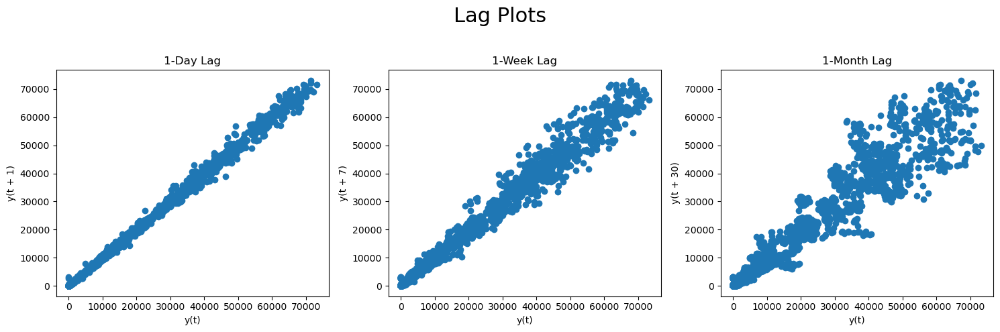

In [22]:
# Increase the figure size
plt.figure(figsize=(15, 5))  # Larger figure

# Create a 1x3 grid of subplots
plt.suptitle('Lag Plots', fontsize=22)

# Daily lag
plt.subplot(1, 3, 1)  # One row, three columns, first plot
pd.plotting.lag_plot(datasets['Close'], lag=1)
plt.title('1-Day Lag')

# Weekly lag
plt.subplot(1, 3, 2)  # One row, three columns, second plot
pd.plotting.lag_plot(datasets['Close'], lag=7)
plt.title('1-Week Lag')

# Monthly lag
plt.subplot(1, 3, 3)  # One row, three columns, third plot
pd.plotting.lag_plot(datasets['Close'], lag=30)
plt.title('1-Month Lag')

# Automatically adjust subplot parameters to provide good spacing
plt.tight_layout(rect=[0, 0, 1, 0.95])  # Adjust to prevent title overlap
plt.show()

484/484 ━━━━━━━━━━━━━━━━━━━━ 0s 413us/step
484/484 ━━━━━━━━━━━━━━━━━━━━ 0s 572us/step
484/484 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step


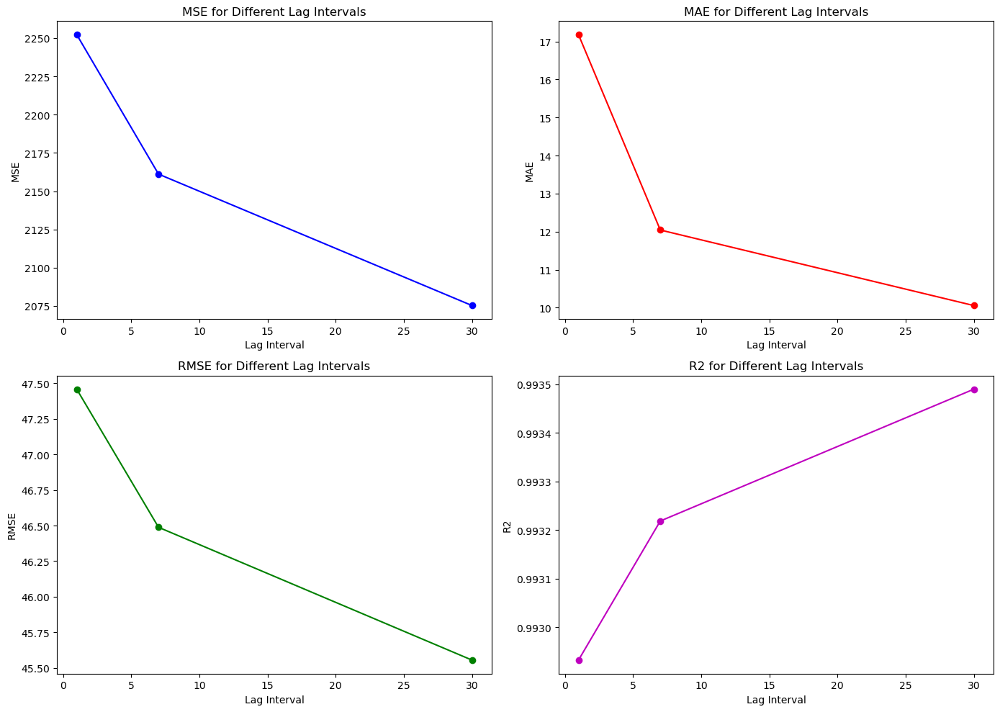

In [24]:
# Load your dataset (replace 'your_dataset.csv' with your actual file path)
df = pd.read_csv('selected_column_data.csv')  # Ensure your dataset is correctly loaded

# Check if the DataFrame is loaded correctly
if df is None or df.empty:
    raise ValueError("The DataFrame is empty or not loaded correctly. Please check the dataset path and format.")

# Function to create sequences with lag
def create_lagged_sequences(data, lookback):
    X, y = [], []
    for i in range(len(data) - lookback):
        X.append(data[i:i + lookback])
        y.append(data[i + lookback])
    return np.array(X), np.array(y)

# Function to build and train models
def build_and_train_model(model_type, X_train, y_train, X_val, y_val, lookback):
    model = Sequential()
    if model_type == 'LSTM':
        model.add(LSTM(50, activation='tanh', return_sequences=False, input_shape=(lookback, 1)))
    elif model_type == 'GRU':
        model.add(GRU(50, activation='tanh', return_sequences=False, input_shape=(lookback, 1)))
    elif model_type == 'Bi-LSTM':
        model.add(Bidirectional(LSTM(50, activation='tanh', return_sequences=False), input_shape=(lookback, 1)))
    model.add(Dropout(0.1))
    model.add(Dense(1))
    model.compile(optimizer='adam', loss='mse')

    early_stopping = EarlyStopping(monitor='val_loss', patience=10, restore_best_weights=True)

    model.fit(X_train, y_train, epochs=100, batch_size=32, validation_data=(X_val, y_val), verbose=0, callbacks=[early_stopping])
    
    return model

# Function to prepare data and evaluate models with different lags
def evaluate_lag_intervals(df, lookback_values):
    performance_metrics = {'Lag': [], 'MSE': [], 'MAE': [], 'RMSE': [], 'R2': []}

    for lookback in lookback_values:
        data = df['Close'].values.reshape(-1, 1)
        scaler = MinMaxScaler()
        data_scaled = scaler.fit_transform(data)

        X, y = create_lagged_sequences(data_scaled, lookback)
        X_train, X_val = X[:int(len(X) * 0.8)], X[int(len(X) * 0.8):]
        y_train, y_val = y[:int(len(y) * 0.8)], y[int(len(y) * 0.8):]

        model = build_and_train_model('GRU', X_train, y_train, X_val, y_val, lookback)
        
        y_pred = model.predict(X_val)
        y_pred_inverse = scaler.inverse_transform(y_pred)
        y_val_inverse = scaler.inverse_transform(y_val.reshape(-1, 1))

        mse = mean_squared_error(y_val_inverse, y_pred_inverse)
        mae = mean_absolute_error(y_val_inverse, y_pred_inverse)
        rmse = np.sqrt(mse)
        r2 = r2_score(y_val_inverse, y_pred_inverse)

        performance_metrics['Lag'].append(lookback)
        performance_metrics['MSE'].append(mse)
        performance_metrics['MAE'].append(mae)
        performance_metrics['RMSE'].append(rmse)
        performance_metrics['R2'].append(r2)

    return pd.DataFrame(performance_metrics)

# Evaluate lags
lookback_values = [1, 7, 30]  # Example lag intervals: 1-day, 1-week, 1-month
performance_metrics_df = evaluate_lag_intervals(df, lookback_values)

# Plot performance metrics
def plot_performance_metrics(df):
    fig, axes = plt.subplots(2, 2, figsize=(14, 10))
    
    axes[0, 0].plot(df['Lag'], df['MSE'], marker='o', linestyle='-', color='b')
    axes[0, 0].set_title('MSE for Different Lag Intervals')
    axes[0, 0].set_xlabel('Lag Interval')
    axes[0, 0].set_ylabel('MSE')

    axes[0, 1].plot(df['Lag'], df['MAE'], marker='o', linestyle='-', color='r')
    axes[0, 1].set_title('MAE for Different Lag Intervals')
    axes[0, 1].set_xlabel('Lag Interval')
    axes[0, 1].set_ylabel('MAE')

    axes[1, 0].plot(df['Lag'], df['RMSE'], marker='o', linestyle='-', color='g')
    axes[1, 0].set_title('RMSE for Different Lag Intervals')
    axes[1, 0].set_xlabel('Lag Interval')
    axes[1, 0].set_ylabel('RMSE')

    axes[1, 1].plot(df['Lag'], df['R2'], marker='o', linestyle='-', color='m')
    axes[1, 1].set_title('R2 for Different Lag Intervals')
    axes[1, 1].set_xlabel('Lag Interval')
    axes[1, 1].set_ylabel('R2')

    plt.tight_layout()
    plt.show()

plot_performance_metrics(performance_metrics_df)

In [25]:
# Assuming 'historical_data' is the DataFrame containing all the data
earliest_dates = datasets.groupby('Symbol')['Date'].min()
print(earliest_dates)

Symbol
ADA      2017-10-01
ATOM     2019-03-14
AVAX     2020-07-13
BAT      2017-06-01
BCH      2017-07-23
BNB      2017-07-25
BTC      2010-07-13
CRO      2018-12-14
DCR      2016-02-10
DOGE     2013-12-15
ETH      2015-08-07
FTM      2018-10-30
LINK     2017-09-20
LTC      2013-04-28
MANA     2017-09-17
MATIC    2019-04-28
MKR      2017-01-29
NEO      2016-09-09
QNT      2018-08-10
RNDR     2020-06-11
SC       2015-08-26
SHIB     2020-08-01
SOL      2020-04-10
STX      2019-10-28
TRX      2017-09-13
VET      2018-08-03
XLM      2014-08-05
XMR      2014-05-21
XRP      2013-08-04
XTZ      2018-07-01
Name: Date, dtype: object


In [26]:
df

,Date,Open,High,Low,Close,Volume,Market Cap,Symbol
0,2024-05-19,66937.930074,67694.298780,65937.177806,66278.370082,1.924909e+10,1.305732e+12,BTC
1,2024-05-18,67066.211043,67387.330366,66663.496521,66940.804410,1.671228e+10,1.318742e+12,BTC
2,2024-05-17,65231.298680,67459.459502,65119.314977,67051.874913,2.803128e+10,1.321187e+12,BTC
3,2024-05-16,66256.111817,66712.429379,64613.056046,65231.580313,3.157308e+10,1.285008e+12,BTC
4,2024-05-15,61553.989847,66454.449965,61330.408780,66267.491467,3.981517e+10,1.305167e+12,BTC
...,...,...,...,...,...,...,...,...
77418,2016-09-13,0.374469,0.375092,0.301766,0.309509,3.336910e+03,0.000000e+00,NEO
77419,2016-09-12,0.376312,0.376671,0.360443,0.374598,1.115840e+03,0.000000e+00,NEO
77420,2016-09-11,0.390948,0.398459,0.372790,0.376150,8.787000e+02,0.000000e+00,NEO
77421,2016-09-10,0.558536,0.559143,0.370960,0.391001,8.108000e+02,0.000000e+00,NEO


In [30]:
crypto_counts = datasets.groupby('Symbol').size().reset_index(name='counte')
crypto_counts

,Symbol,counte
0,ADA,2423
1,ATOM,1894
2,AVAX,1338
3,BAT,2545
4,BCH,2493
5,BNB,2491
6,BTC,5060
7,CRO,1984
8,DCR,3022
9,DOGE,3809


In [31]:
datasets["Symbol"].count()

77423

In [32]:
merged_data = pd.merge(data, earliest_dates, on='Symbol', how='inner')

In [33]:
merged_data = pd.merge(merged_data, crypto_counts, on='Symbol', how='inner')

In [34]:
new_column_name = {
    "Name": "Crypto",
    "Symbol": "Symbol",
    "Market Cap Formatted": "Market Cap",
    "Dominance (%)": "Dominance (%)",
    "Date": "Date: Since",
    "counte": "Number of Observations"
}

In [35]:
merged_data.rename(columns=new_column_name, inplace=True)

In [36]:
merged_data.index +=1

In [37]:
merged_data = pd.read_csv("merged_data.csv")

In [38]:
merged_data.index +=1

In [39]:
merged_data

,Crypto,Symbol,Market Cap,Dominance (%),Date Since,Number of Observations
1,Bitcoin,BTC,$1.33 Trillion,62.77%,7/13/10,5060
2,Tezos,XTZ,$944.60 Million,0.04%,7/1/18,2150
3,Decentraland,MANA,$848.82 Million,0.04%,9/17/17,2437
4,Ethereum,ETH,$454.93 Billion,21.44%,8/7/15,3209
5,Siacoin,SC,$391.06 Million,0.02%,8/26/15,3189
6,Basic Attention Token,BAT,$362.93 Million,0.02%,6/1/17,2545
7,Decred,DCR,$332.54 Million,0.02%,2/10/16,3022
8,BNB,BNB,$87.73 Billion,4.13%,7/25/17,2491
9,Solana,SOL,$76.45 Billion,3.60%,4/10/20,1501
10,XRP,XRP,$28.68 Billion,1.35%,8/4/13,3942


# Reading the csv file (selected_historical_data.csv) instead of CmcScraper

In [40]:
import pandas as pd
import numpy as np
from sklearn.preprocessing import MinMaxScaler
from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score
from keras.models import Sequential, load_model
from keras.layers import LSTM, GRU, Bidirectional, Dense, Dropout
from keras.callbacks import EarlyStopping
import pickle
import os

# List of cryptocurrency symbols 
cryptos = ["BTC", "ETH", "BNB", "ADA", "SOL", "XRP", "LTC", "LINK", "DOGE", "SHIB", 
           "MANA", "VET", "XMR", "BCH", "AVAX", "TRX", "MATIC", "CRO", "RNDR", "XTZ", 
           "BAT", "SC", "FTM", "DCR", "MKR", "ATOM", "STX", "XLM", "QNT", "NEO"]

lookback = 30
test_days = 365

def get_historical_data(csv_file, crypto_symbol):
    try:
        df = pd.read_csv(csv_file)
        df = df[df['Symbol'] == crypto_symbol]
        df['Date'] = pd.to_datetime(df['Date'])
        df = df.sort_values(by='Date')  # Ensure data is sorted by date
        df['Close'] = df['Close'].astype(float)
        return df
    except Exception as e:
        print(f"Error fetching data for {crypto_symbol}: {e}")
        return None

def prepare_data(df, lookback, test_days):
    data = df[['Close']].values
    
    train_data = data[:-test_days]
    test_data = data[-test_days:]
    
    scaler = MinMaxScaler()
    train_scaled = scaler.fit_transform(train_data)
    test_scaled = scaler.transform(test_data)
    
    def create_sequences(data, lookback):
        X, y = [], []
        for i in range(len(data) - lookback - 1):
            X.append(data[i:i + lookback])
            y.append(data[i + lookback + 1])
        return np.array(X), np.array(y)
    
    X_train, y_train = create_sequences(train_scaled, lookback)
    X_test, y_test = create_sequences(test_scaled, lookback)
    
    return X_train, X_test, y_train, y_test, scaler

def build_and_train_model(model_type, X_train, y_train, X_val, y_val):
    model = Sequential()
    if model_type == 'LSTM':
        model.add(LSTM(50, activation='tanh', return_sequences=False, input_shape=(lookback, 1)))
    elif model_type == 'GRU':
        model.add(GRU(50, activation='tanh', return_sequences=False, input_shape=(lookback, 1)))
    elif model_type == 'Bi-LSTM':
        model.add(Bidirectional(LSTM(50, activation='tanh', return_sequences=False), input_shape=(lookback, 1)))
    model.add(Dropout(0.1))
    model.add(Dense(1))
    model.compile(optimizer='adam', loss='mse')

    early_stopping = EarlyStopping(monitor='val_loss', patience=10, restore_best_weights=True)

    history = model.fit(X_train, y_train, epochs=100, batch_size=32, validation_data=(X_val, y_val), 
                        verbose=1, callbacks=[early_stopping])
    
    val_loss = min(history.history['val_loss'])
    return model, val_loss

def train_and_save_models(csv_file, crypto):
    df = get_historical_data(csv_file, crypto)
    if df is None:
        return  # Skip this cryptocurrency if no data is available
    
    X_train, X_test, y_train, y_test, scaler = prepare_data(df, lookback, test_days)
    
    # Split train data into train and validation sets
    val_size = int(0.2 * len(X_train))
    X_val, y_val = X_train[-val_size:], y_train[-val_size:]
    X_train, y_train = X_train[:-val_size], y_train[:-val_size]
    
    model_lstm, val_loss_lstm = build_and_train_model('LSTM', X_train, y_train, X_val, y_val)
    model_gru, val_loss_gru = build_and_train_model('GRU', X_train, y_train, X_val, y_val)
    model_bilstm, val_loss_bilstm = build_and_train_model('Bi-LSTM', X_train, y_train, X_val, y_val)
    
    # Save models
    os.makedirs('../backend/models', exist_ok=True)
    os.makedirs('../backend/scalers', exist_ok=True)
    
    model_lstm.save(f'../backend/models/{crypto}_lstm.h5')
    model_gru.save(f'../backend/models/{crypto}_gru.h5')
    model_bilstm.save(f'../backend/models/{crypto}_bilstm.h5')
    
    # Save scaler and validation losses
    with open(f'../backend/scalers/{crypto}_scaler.pkl', 'wb') as f:
        pickle.dump({'scaler': scaler, 'val_losses': [val_loss_lstm, val_loss_gru, val_loss_bilstm]}, f)

def load_models_and_predict(csv_file, crypto, lookback, X_test, scaler):
    # Load models
    model_lstm = load_model(f'../backend/models/{crypto}_lstm.h5', compile=False)
    model_gru = load_model(f'../backend/models/{crypto}_gru.h5', compile=False)
    model_bilstm = load_model(f'../backend/models/{crypto}_bilstm.h5', compile=False)
    
    # Load validation losses
    with open(f'../backend/scalers/{crypto}_scaler.pkl', 'rb') as f:
        data = pickle.load(f)
        val_losses = data['val_losses']
    
    # Determine the best model
    best_model_index = np.argmin(val_losses)
    models = [model_lstm, model_gru, model_bilstm]
    best_model = models[best_model_index]
    
    # Make predictions with the best model
    predictions_scaled = best_model.predict(X_test)
    
    # Inverse scale the predictions
    predictions = scaler.inverse_transform(predictions_scaled)
    
    return predictions

def mean_absolute_percentage_error(y_true, y_pred):
    y_true, y_pred = np.array(y_true), np.array(y_pred)
    return np.mean(np.abs((y_true - y_pred) / y_true)) * 100

In [41]:
# Path to the CSV file containing historical data
csv_file = 'selected_column_data.csv'

# Train and save models for all cryptocurrencies
for crypto in cryptos:
    train_and_save_models(csv_file, crypto)

# Prediction for all cryptocurrencies for the test period
predictions = []
metrics = []

for crypto in cryptos:
    df = get_historical_data(csv_file, crypto)
    if df is None:
        continue  # Skip this cryptocurrency if no data is available
    
    X_train, X_test, y_train, y_test, scaler = prepare_data(df, lookback, test_days)
    y_test = scaler.inverse_transform(y_test)  # Inverse scale the actual values
    predicted_prices = load_models_and_predict(csv_file, crypto, lookback, X_test, scaler)
    
    predictions.append({'crypto': crypto, 'actual_prices': y_test.flatten(), 'predicted_prices': predicted_prices.flatten()})

    # Calculate metrics
    mae = mean_absolute_error(y_test, predicted_prices)
    mse = mean_squared_error(y_test, predicted_prices)
    rmse = np.sqrt(mse)
    mape = mean_absolute_percentage_error(y_test, predicted_prices)
    r2 = r2_score(y_test, predicted_prices)
    
    metrics.append({
        'crypto': crypto,
        'MAE': mae,
        'MSE': mse,
        'RMSE': rmse,
        'MAPE (%)': mape,
        'R2': r2
    })

# Save predictions to a DataFrame
predictions_df = pd.DataFrame(predictions)
metrics_df = pd.DataFrame(metrics)

# Save to a CSV file
predictions_df.to_csv('crypto_predictions_2.csv', index=False)
metrics_df.to_csv('crypto_metrics.csv', index=False)

print(metrics_df)

Epoch 1/100
117/117 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - loss: 0.0010 - val_loss: 0.0024
Epoch 2/100
117/117 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - loss: 9.3852e-05 - val_loss: 0.0020
Epoch 3/100
117/117 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - loss: 7.4100e-05 - val_loss: 0.0029
Epoch 4/100
117/117 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.5046e-05 - val_loss: 0.0020
Epoch 5/100
117/117 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.2530e-05 - val_loss: 0.0026
Epoch 6/100
117/117 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 4.9860e-05 - val_loss: 0.0033
Epoch 7/100
117/117 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.8710e-05 - val_loss: 0.0033
Epoch 8/100
117/117 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - loss: 5.0448e-05 - val_loss: 0.0033
Epoch 9/100
117/117 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - loss: 4.8138e-05 - val_loss: 0.0043
Epoch 10/100
117/117 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - loss: 4.7672e-05 - val_loss: 0.0058
Epoch 11/100
117/117 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - loss: 4.7250e-05 - val_loss: 0.0039
E

Epoch 1/100
71/71 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - loss: 0.0141 - val_loss: 0.0025
Epoch 2/100
71/71 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.0013 - val_loss: 0.0022
Epoch 3/100
71/71 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.0013 - val_loss: 0.0021
Epoch 4/100
71/71 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 9.1999e-04 - val_loss: 0.0029
Epoch 5/100
71/71 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 8.3179e-04 - val_loss: 0.0028
Epoch 6/100
71/71 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 7.7273e-04 - val_loss: 0.0016
Epoch 7/100
71/71 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 9.2906e-04 - val_loss: 0.0013
Epoch 8/100
71/71 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 6.1748e-04 - val_loss: 0.0012
Epoch 9/100
71/71 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 7.6310e-04 - val_loss: 0.0014
Epoch 10/100
71/71 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.7866e-04 - val_loss: 0.0012
Epoch 11/100
71/71 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 7.2999e-04 - val_loss: 0.0012
Epoch 12/100
71/71 ━━━━━━━━━━━━

71/71 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 3.3885e-04 - val_loss: 7.1644e-04
Epoch 49/100
71/71 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 3.6483e-04 - val_loss: 7.9316e-04
Epoch 50/100
71/71 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 3.3340e-04 - val_loss: 7.1039e-04
Epoch 51/100
71/71 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 3.8767e-04 - val_loss: 7.7282e-04
Epoch 52/100
71/71 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.0610e-04 - val_loss: 9.0093e-04
Epoch 53/100
71/71 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.1490e-04 - val_loss: 7.0948e-04
Epoch 54/100
71/71 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 3.4346e-04 - val_loss: 7.3132e-04
Epoch 55/100
71/71 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 3.6054e-04 - val_loss: 7.2456e-04
Epoch 56/100
71/71 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 3.2434e-04 - val_loss: 7.0502e-04
Epoch 57/100
71/71 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 3.8775e-04 - val_loss: 7.3968e-04
Epoch 58/100
71/71 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 3.4054e-04 - 

Epoch 1/100
53/53 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - loss: 0.0508 - val_loss: 0.0019
Epoch 2/100
53/53 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.0031 - val_loss: 0.0012
Epoch 3/100
53/53 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.0026 - val_loss: 0.0017
Epoch 4/100
53/53 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.0023 - val_loss: 0.0016
Epoch 5/100
53/53 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.0016 - val_loss: 0.0010
Epoch 6/100
53/53 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.0020 - val_loss: 0.0013
Epoch 7/100
53/53 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.0019 - val_loss: 0.0015
Epoch 8/100
53/53 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.0015 - val_loss: 0.0017
Epoch 9/100
53/53 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.0014 - val_loss: 8.2231e-04
Epoch 10/100
53/53 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.0014 - val_loss: 0.0033
Epoch 11/100
53/53 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.0016 - val_loss: 7.8758e-04
Epoch 12/100
53/53 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - l

Epoch 1/100
51/51 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - loss: 0.0206 - val_loss: 2.5318e-04
Epoch 2/100
51/51 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.0027 - val_loss: 2.8385e-04
Epoch 3/100
51/51 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 0.0018 - val_loss: 5.0158e-04
Epoch 4/100
51/51 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 0.0017 - val_loss: 3.0289e-04
Epoch 5/100
51/51 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.0019 - val_loss: 2.6007e-04
Epoch 6/100
51/51 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.0014 - val_loss: 3.2946e-04
Epoch 7/100
51/51 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 0.0016 - val_loss: 2.2766e-04
Epoch 8/100
51/51 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.0013 - val_loss: 3.1514e-04
Epoch 9/100
51/51 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 0.0013 - val_loss: 2.0511e-04
Epoch 10/100
51/51 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.0010 - val_loss: 2.2244e-04
Epoch 11/100
51/51 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 0.0011 - val_loss: 1.7730e-04
Epoch 12/100
51/51 

Epoch 1/100
28/28 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - loss: 0.0557 - val_loss: 7.2080e-04
Epoch 2/100
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.0053 - val_loss: 2.2610e-04
Epoch 3/100
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.0042 - val_loss: 3.4423e-04
Epoch 4/100
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.0035 - val_loss: 1.7372e-04
Epoch 5/100
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.0030 - val_loss: 2.4595e-04
Epoch 6/100
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.0030 - val_loss: 1.5784e-04
Epoch 7/100
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.0030 - val_loss: 1.5579e-04
Epoch 8/100
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.0028 - val_loss: 1.8340e-04
Epoch 9/100
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.0022 - val_loss: 1.9372e-04
Epoch 10/100
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.0021 - val_loss: 1.7386e-04
Epoch 11/100
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.0019 - val_loss: 1.8194e-04
Epoch 12/100
28/28 

28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 0.0019 - val_loss: 1.6484e-04
Epoch 24/100
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 0.0018 - val_loss: 1.9303e-04
Epoch 25/100
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 0.0021 - val_loss: 1.4922e-04
Epoch 26/100
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 0.0024 - val_loss: 1.3968e-04
Epoch 27/100
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 0.0017 - val_loss: 2.2418e-04
Epoch 28/100
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 0.0017 - val_loss: 1.4638e-04
Epoch 29/100
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 0.0019 - val_loss: 1.9503e-04
Epoch 30/100
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 0.0019 - val_loss: 2.2374e-04
Epoch 31/100
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 0.0020 - val_loss: 1.4569e-04
Epoch 32/100
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 0.0019 - val_loss: 1.7335e-04
Epoch 33/100
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 0.0016 - val_loss: 1.4206e-04
Epoch 34/100
28/28 ━━━━

Epoch 1/100
89/89 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - loss: 0.0049 - val_loss: 8.0755e-04
Epoch 2/100
89/89 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 7.9253e-04 - val_loss: 0.0010
Epoch 3/100
89/89 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.0012 - val_loss: 3.3991e-04
Epoch 4/100
89/89 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.8972e-04 - val_loss: 7.4586e-04
Epoch 5/100
89/89 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 7.4721e-04 - val_loss: 3.3487e-04
Epoch 6/100
89/89 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.5161e-04 - val_loss: 3.0396e-04
Epoch 7/100
89/89 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.7864e-04 - val_loss: 2.9102e-04
Epoch 8/100
89/89 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.2330e-04 - val_loss: 2.9910e-04
Epoch 9/100
89/89 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.7946e-04 - val_loss: 3.2521e-04
Epoch 10/100
89/89 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.7141e-04 - val_loss: 2.8273e-04
Epoch 11/100
89/89 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4.5525e-04 - val_loss

Epoch 1/100
92/92 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - loss: 0.0046 - val_loss: 0.0011
Epoch 2/100
92/92 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.0012 - val_loss: 0.0010
Epoch 3/100
92/92 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.0010 - val_loss: 0.0013
Epoch 4/100
92/92 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.0012 - val_loss: 7.7479e-04
Epoch 5/100
92/92 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 9.1417e-04 - val_loss: 7.4708e-04
Epoch 6/100
92/92 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 7.9213e-04 - val_loss: 7.2946e-04
Epoch 7/100
92/92 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 7.0094e-04 - val_loss: 7.5861e-04
Epoch 8/100
92/92 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 7.4216e-04 - val_loss: 8.1365e-04
Epoch 9/100
92/92 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 7.9277e-04 - val_loss: 8.1306e-04
Epoch 10/100
92/92 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.9400e-04 - val_loss: 8.2337e-04
Epoch 11/100
92/92 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.6209e-04 - val_loss: 8.1851e-04
Epo

92/92 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - loss: 0.0014 - val_loss: 9.6140e-04
Epoch 5/100
92/92 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - loss: 9.6729e-04 - val_loss: 0.0013
Epoch 6/100
92/92 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - loss: 0.0012 - val_loss: 0.0010
Epoch 7/100
92/92 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - loss: 9.2416e-04 - val_loss: 9.4782e-04
Epoch 8/100
92/92 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - loss: 9.7976e-04 - val_loss: 8.1961e-04
Epoch 9/100
92/92 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - loss: 8.1677e-04 - val_loss: 9.4086e-04
Epoch 10/100
92/92 ━━━━━━━━━━━━━━━━━━━━ 1s 9ms/step - loss: 0.0010 - val_loss: 7.9832e-04
Epoch 11/100
92/92 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - loss: 7.8973e-04 - val_loss: 7.8312e-04
Epoch 12/100
92/92 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - loss: 6.9130e-04 - val_loss: 8.6777e-04
Epoch 13/100
92/92 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - loss: 8.6174e-04 - val_loss: 0.0011
Epoch 14/100
92/92 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - loss: 5.5720e-04 - val_loss: 8.1333e-04
Epoch 15

Epoch 1/100
51/51 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - loss: 0.0158 - val_loss: 2.4756e-04
Epoch 2/100
51/51 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.0019 - val_loss: 2.0398e-04
Epoch 3/100
51/51 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.0020 - val_loss: 2.0574e-04
Epoch 4/100
51/51 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.0014 - val_loss: 1.8547e-04
Epoch 5/100
51/51 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.0017 - val_loss: 3.3644e-04
Epoch 6/100
51/51 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.0016 - val_loss: 1.8055e-04
Epoch 7/100
51/51 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.0014 - val_loss: 3.0743e-04
Epoch 8/100
51/51 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.0014 - val_loss: 2.2830e-04
Epoch 9/100
51/51 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.0011 - val_loss: 1.9249e-04
Epoch 10/100
51/51 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.0012 - val_loss: 2.4199e-04
Epoch 11/100
51/51 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.0011 - val_loss: 3.7870e-04
Epoch 12/100
51/51 

Epoch 1/100
86/86 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - loss: 0.0043 - val_loss: 6.7279e-04
Epoch 2/100
86/86 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.0012 - val_loss: 6.3051e-04
Epoch 3/100
86/86 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.0011 - val_loss: 6.4618e-04
Epoch 4/100
86/86 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 7.0278e-04 - val_loss: 4.6585e-04
Epoch 5/100
86/86 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 8.1319e-04 - val_loss: 5.1864e-04
Epoch 6/100
86/86 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 7.0574e-04 - val_loss: 5.1889e-04
Epoch 7/100
86/86 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 9.0451e-04 - val_loss: 6.0618e-04
Epoch 8/100
86/86 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.4128e-04 - val_loss: 0.0013
Epoch 9/100
86/86 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 7.6875e-04 - val_loss: 5.8283e-04
Epoch 10/100
86/86 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.5909e-04 - val_loss: 0.0014
Epoch 11/100
86/86 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.9648e-04 - val_loss: 0.0019

Epoch 21/100
86/86 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - loss: 5.2272e-04 - val_loss: 5.0000e-04
Epoch 22/100
86/86 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - loss: 4.9400e-04 - val_loss: 5.5816e-04
Epoch 23/100
86/86 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - loss: 3.2057e-04 - val_loss: 4.2398e-04
Epoch 24/100
86/86 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - loss: 3.5578e-04 - val_loss: 0.0013
Epoch 25/100
86/86 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - loss: 3.8102e-04 - val_loss: 3.2546e-04
Epoch 26/100
86/86 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - loss: 3.2443e-04 - val_loss: 0.0014
Epoch 27/100
86/86 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - loss: 4.3088e-04 - val_loss: 0.0028
Epoch 28/100
86/86 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - loss: 4.6911e-04 - val_loss: 3.1299e-04
Epoch 29/100
86/86 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - loss: 3.9139e-04 - val_loss: 5.3583e-04
Epoch 30/100
86/86 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - loss: 4.3253e-04 - val_loss: 4.1720e-04
Epoch 31/100
86/86 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - loss: 4.0130e-04 -

Epoch 1/100
25/25 ━━━━━━━━━━━━━━━━━━━━ 1s 9ms/step - loss: 0.0331 - val_loss: 1.6133e-04
Epoch 2/100
25/25 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.0057 - val_loss: 1.2859e-04
Epoch 3/100
25/25 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.0036 - val_loss: 1.1926e-04
Epoch 4/100
25/25 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.0033 - val_loss: 1.1499e-04
Epoch 5/100
25/25 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.0022 - val_loss: 2.2688e-04
Epoch 6/100
25/25 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.0032 - val_loss: 1.0020e-04
Epoch 7/100
25/25 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.0033 - val_loss: 9.3389e-05
Epoch 8/100
25/25 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.0029 - val_loss: 8.9790e-05
Epoch 9/100
25/25 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.0027 - val_loss: 9.7057e-05
Epoch 10/100
25/25 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.0023 - val_loss: 1.5970e-04
Epoch 11/100
25/25 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.0032 - val_loss: 9.8749e-05
Epoch 12/100
25/25 

25/25 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss: 0.0016 - val_loss: 2.5964e-04
Epoch 16/100
25/25 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 0.0024 - val_loss: 9.5166e-05
Epoch 17/100
25/25 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 0.0019 - val_loss: 4.2822e-04
Epoch 18/100
25/25 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 0.0029 - val_loss: 7.5083e-05
Epoch 19/100
25/25 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 0.0015 - val_loss: 9.1594e-04
Epoch 20/100
25/25 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 0.0028 - val_loss: 1.1913e-04
Epoch 21/100
25/25 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 0.0022 - val_loss: 6.7634e-05
Epoch 22/100
25/25 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 0.0020 - val_loss: 1.5612e-04
Epoch 23/100
25/25 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 0.0018 - val_loss: 1.9339e-04
Epoch 24/100
25/25 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 0.0018 - val_loss: 1.1356e-04
Epoch 25/100
25/25 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 0.0014 - val_loss: 6.0635e-05
Epoch 26/100
25/25 ━━━━

Epoch 1/100
52/52 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - loss: 0.0185 - val_loss: 3.6453e-04
Epoch 2/100
52/52 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.0018 - val_loss: 3.7788e-04
Epoch 3/100
52/52 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.0016 - val_loss: 5.6022e-04
Epoch 4/100
52/52 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.0018 - val_loss: 3.2208e-04
Epoch 5/100
52/52 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.0011 - val_loss: 6.2363e-04
Epoch 6/100
52/52 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.0012 - val_loss: 4.2867e-04
Epoch 7/100
52/52 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 9.8761e-04 - val_loss: 0.0013
Epoch 8/100
52/52 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.0018 - val_loss: 3.7748e-04
Epoch 9/100
52/52 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.0011 - val_loss: 2.5620e-04
Epoch 10/100
52/52 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 7.6671e-04 - val_loss: 4.0915e-04
Epoch 11/100
52/52 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 8.4778e-04 - val_loss: 3.2288e-04
Epoch 12/10

Epoch 1/100
44/44 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - loss: 0.0286 - val_loss: 3.6505e-04
Epoch 2/100
44/44 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.0025 - val_loss: 6.1565e-05
Epoch 3/100
44/44 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.0026 - val_loss: 1.1063e-04
Epoch 4/100
44/44 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.0018 - val_loss: 1.5550e-04
Epoch 5/100
44/44 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.0023 - val_loss: 2.1974e-04
Epoch 6/100
44/44 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.0017 - val_loss: 3.2581e-04
Epoch 7/100
44/44 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.0016 - val_loss: 5.8266e-05
Epoch 8/100
44/44 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.0017 - val_loss: 1.1129e-04
Epoch 9/100
44/44 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.0015 - val_loss: 6.0387e-04
Epoch 10/100
44/44 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.0019 - val_loss: 6.6189e-05
Epoch 11/100
44/44 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.0013 - val_loss: 5.2606e-05
Epoch 12/100
44/44 

44/44 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 0.0010 - val_loss: 3.5626e-05
Epoch 57/100
44/44 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 7.4089e-04 - val_loss: 1.6086e-04
Epoch 58/100
44/44 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 8.5606e-04 - val_loss: 3.4388e-05
Epoch 59/100
44/44 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 8.8226e-04 - val_loss: 3.7057e-05
Epoch 60/100
44/44 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 7.6678e-04 - val_loss: 5.6884e-05
Epoch 61/100
44/44 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 8.7035e-04 - val_loss: 4.8693e-05
Epoch 62/100
44/44 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 8.0088e-04 - val_loss: 3.3578e-05
Epoch 63/100
44/44 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 0.0010 - val_loss: 5.5857e-05


Epoch 1/100
82/82 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - loss: 0.0176 - val_loss: 0.0014
Epoch 2/100
82/82 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.0020 - val_loss: 0.0012
Epoch 3/100
82/82 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.0016 - val_loss: 0.0011
Epoch 4/100
82/82 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 0.0014 - val_loss: 0.0011
Epoch 5/100
82/82 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.0012 - val_loss: 0.0012
Epoch 6/100
82/82 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.0012 - val_loss: 0.0011
Epoch 7/100
82/82 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.0012 - val_loss: 9.1492e-04
Epoch 8/100
82/82 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.0011 - val_loss: 0.0011
Epoch 9/100
82/82 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 0.0012 - val_loss: 8.6500e-04
Epoch 10/100
82/82 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.0010 - val_loss: 9.2104e-04
Epoch 11/100
82/82 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.0011 - val_loss: 8.6173e-04
Epoch 12/100
82/82 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/

Epoch 66/100
82/82 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 7.5375e-04 - val_loss: 6.5201e-04
Epoch 67/100
82/82 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 7.7178e-04 - val_loss: 6.9844e-04
Epoch 68/100
82/82 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 7.1412e-04 - val_loss: 7.8781e-04
Epoch 69/100
82/82 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 6.9997e-04 - val_loss: 5.9931e-04
Epoch 70/100
82/82 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 7.6468e-04 - val_loss: 5.8237e-04
Epoch 71/100
82/82 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 5.9160e-04 - val_loss: 6.5803e-04
Epoch 72/100
82/82 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 7.3299e-04 - val_loss: 6.7347e-04
Epoch 73/100
82/82 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 6.6466e-04 - val_loss: 6.0830e-04
Epoch 74/100
82/82 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 6.1029e-04 - val_loss: 5.7976e-04
Epoch 75/100
82/82 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 6.5611e-04 - val_loss: 5.7177e-04
Epoch 76/100
82/82 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 

82/82 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - loss: 8.6773e-04 - val_loss: 7.2286e-04
Epoch 40/100
82/82 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - loss: 8.9096e-04 - val_loss: 8.2419e-04
Epoch 41/100
82/82 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - loss: 7.4250e-04 - val_loss: 6.0688e-04
Epoch 42/100
82/82 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - loss: 7.3265e-04 - val_loss: 7.2344e-04
Epoch 43/100
82/82 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - loss: 7.8767e-04 - val_loss: 6.5003e-04
Epoch 44/100
82/82 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - loss: 6.5297e-04 - val_loss: 6.7902e-04
Epoch 45/100
82/82 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - loss: 6.7226e-04 - val_loss: 6.3871e-04
Epoch 46/100
82/82 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - loss: 7.7009e-04 - val_loss: 7.9846e-04
Epoch 47/100
82/82 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - loss: 6.2966e-04 - val_loss: 8.2024e-04
Epoch 48/100
82/82 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - loss: 7.9735e-04 - val_loss: 6.9419e-04
Epoch 49/100
82/82 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - loss: 8.4255e-04 - 

Epoch 1/100
53/53 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - loss: 0.0101 - val_loss: 9.4528e-05
Epoch 2/100
53/53 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.0023 - val_loss: 2.2355e-04
Epoch 3/100
53/53 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.0016 - val_loss: 2.2462e-04
Epoch 4/100
53/53 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.0011 - val_loss: 2.1306e-05
Epoch 5/100
53/53 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 9.0496e-04 - val_loss: 1.0182e-05
Epoch 6/100
53/53 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.0014 - val_loss: 2.4104e-05
Epoch 7/100
53/53 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.0012 - val_loss: 2.0710e-05
Epoch 8/100
53/53 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.0011 - val_loss: 1.2641e-05
Epoch 9/100
53/53 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 9.4494e-04 - val_loss: 2.6976e-05
Epoch 10/100
53/53 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.0013 - val_loss: 1.8490e-05
Epoch 11/100
53/53 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.0014 - val_loss: 1.3763e-05
Epoch 12/10

Epoch 1/100
24/24 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - loss: 0.0791 - val_loss: 0.0036
Epoch 2/100
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.0095 - val_loss: 3.0044e-04
Epoch 3/100
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 0.0057 - val_loss: 2.5352e-04
Epoch 4/100
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.0053 - val_loss: 2.7520e-04
Epoch 5/100
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.0051 - val_loss: 1.8590e-04
Epoch 6/100
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.0049 - val_loss: 3.0950e-04
Epoch 7/100
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.0046 - val_loss: 1.3789e-04
Epoch 8/100
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.0044 - val_loss: 1.2812e-04
Epoch 9/100
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.0043 - val_loss: 1.8904e-04
Epoch 10/100
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 0.0040 - val_loss: 1.6318e-04
Epoch 11/100
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.0038 - val_loss: 1.8919e-04
Epoch 12/100
24/24 ━━━━

Epoch 1/100
52/52 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - loss: 0.0196 - val_loss: 0.0011
Epoch 2/100
52/52 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.0033 - val_loss: 3.6671e-04
Epoch 3/100
52/52 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.0036 - val_loss: 5.6270e-04
Epoch 4/100
52/52 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.0030 - val_loss: 3.1817e-04
Epoch 5/100
52/52 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.0019 - val_loss: 4.4667e-04
Epoch 6/100
52/52 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.0028 - val_loss: 8.8161e-04
Epoch 7/100
52/52 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.0029 - val_loss: 4.6768e-04
Epoch 8/100
52/52 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.0016 - val_loss: 3.0762e-04
Epoch 9/100
52/52 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.0029 - val_loss: 2.8191e-04
Epoch 10/100
52/52 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.0025 - val_loss: 2.4671e-04
Epoch 11/100
52/52 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.0014 - val_loss: 2.6559e-04
Epoch 12/100
52/52 ━━━━

Epoch 20/100
52/52 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 0.0022 - val_loss: 2.2767e-04
Epoch 21/100
52/52 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 0.0013 - val_loss: 1.8059e-04
Epoch 22/100
52/52 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 0.0014 - val_loss: 3.8618e-04
Epoch 23/100
52/52 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 0.0013 - val_loss: 1.7218e-04
Epoch 24/100
52/52 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 0.0016 - val_loss: 2.8425e-04
Epoch 25/100
52/52 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 0.0016 - val_loss: 1.6959e-04
Epoch 26/100
52/52 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 0.0022 - val_loss: 1.6863e-04
Epoch 27/100
52/52 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 9.9592e-04 - val_loss: 2.0787e-04
Epoch 28/100
52/52 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 0.0013 - val_loss: 1.7725e-04
Epoch 29/100
52/52 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 0.0011 - val_loss: 2.5439e-04
Epoch 30/100
52/52 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 0.0015 - val_loss: 2.0474e-04
Epoch 

Epoch 1/100
37/37 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - loss: 0.0291 - val_loss: 0.0013
Epoch 2/100
37/37 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.0030 - val_loss: 8.6613e-04
Epoch 3/100
37/37 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.0026 - val_loss: 8.9088e-04
Epoch 4/100
37/37 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.0027 - val_loss: 8.0427e-04
Epoch 5/100
37/37 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.0023 - val_loss: 9.0771e-04
Epoch 6/100
37/37 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.0029 - val_loss: 9.0847e-04
Epoch 7/100
37/37 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.0023 - val_loss: 7.9643e-04
Epoch 8/100
37/37 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.0024 - val_loss: 7.9275e-04
Epoch 9/100
37/37 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.0020 - val_loss: 7.8416e-04
Epoch 10/100
37/37 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.0022 - val_loss: 7.6174e-04
Epoch 11/100
37/37 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.0022 - val_loss: 8.5049e-04
Epoch 12/100
37/37 ━━━━

37/37 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 0.0021 - val_loss: 0.0012


Epoch 1/100
40/40 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - loss: 0.0300 - val_loss: 1.2118e-04
Epoch 2/100
40/40 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.0025 - val_loss: 1.3334e-04
Epoch 3/100
40/40 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.0023 - val_loss: 1.3781e-04
Epoch 4/100
40/40 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.0017 - val_loss: 1.0328e-04
Epoch 5/100
40/40 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.0015 - val_loss: 1.8163e-04
Epoch 6/100
40/40 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.0015 - val_loss: 1.2701e-04
Epoch 7/100
40/40 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.0016 - val_loss: 1.4794e-04
Epoch 8/100
40/40 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.0013 - val_loss: 7.6955e-05
Epoch 9/100
40/40 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.0014 - val_loss: 2.4615e-04
Epoch 10/100
40/40 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.0011 - val_loss: 8.4304e-05
Epoch 11/100
40/40 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.0011 - val_loss: 7.8103e-05
Epoch 12/100
40/40 

Epoch 39/100
40/40 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 9.5559e-04 - val_loss: 7.5576e-05
Epoch 40/100
40/40 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 6.2582e-04 - val_loss: 5.1963e-05
Epoch 41/100
40/40 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 6.9277e-04 - val_loss: 7.0794e-05
Epoch 42/100
40/40 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 7.3270e-04 - val_loss: 6.7325e-05
Epoch 43/100
40/40 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 6.2873e-04 - val_loss: 6.1378e-05
Epoch 44/100
40/40 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 6.3595e-04 - val_loss: 6.6522e-05
Epoch 45/100
40/40 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 6.5349e-04 - val_loss: 5.3871e-05
Epoch 46/100
40/40 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss: 7.0350e-04 - val_loss: 4.8278e-05
Epoch 47/100
40/40 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 5.5964e-04 - val_loss: 6.0961e-05
Epoch 48/100
40/40 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 7.7403e-04 - val_loss: 5.1836e-05
Epoch 49/100
40/40 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 

Epoch 1/100
27/27 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - loss: 0.0304 - val_loss: 0.0018
Epoch 2/100
27/27 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.0056 - val_loss: 0.0012
Epoch 3/100
27/27 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.0041 - val_loss: 0.0010
Epoch 4/100
27/27 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.0047 - val_loss: 8.7119e-04
Epoch 5/100
27/27 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.0026 - val_loss: 8.0661e-04
Epoch 6/100
27/27 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.0033 - val_loss: 7.6562e-04
Epoch 7/100
27/27 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.0030 - val_loss: 7.4367e-04
Epoch 8/100
27/27 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.0025 - val_loss: 8.2381e-04
Epoch 9/100
27/27 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.0019 - val_loss: 8.0083e-04
Epoch 10/100
27/27 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.0019 - val_loss: 7.2729e-04
Epoch 11/100
27/27 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.0024 - val_loss: 7.0955e-04
Epoch 12/100
27/27 ━━━━━━━━━━━━

27/27 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.0016 - val_loss: 4.6275e-04
Epoch 34/100
27/27 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 9.6958e-04 - val_loss: 5.0801e-04
Epoch 35/100
27/27 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.0010 - val_loss: 5.5660e-04
Epoch 36/100
27/27 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.0013 - val_loss: 5.5389e-04
Epoch 37/100
27/27 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.0012 - val_loss: 4.4814e-04
Epoch 38/100
27/27 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.0014 - val_loss: 5.6344e-04
Epoch 39/100
27/27 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.0014 - val_loss: 4.8156e-04
Epoch 40/100
27/27 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.0013 - val_loss: 4.4478e-04
Epoch 41/100
27/27 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 9.7946e-04 - val_loss: 4.2902e-04
Epoch 42/100
27/27 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.0014 - val_loss: 5.4515e-04
Epoch 43/100
27/27 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.0010 - val_loss: 5.5393e-04
Epoch 44/100
27

Epoch 1/100
44/44 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - loss: 0.0173 - val_loss: 2.1706e-04
Epoch 2/100
44/44 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.0032 - val_loss: 1.6107e-04
Epoch 3/100
44/44 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.0028 - val_loss: 1.6766e-04
Epoch 4/100
44/44 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.0024 - val_loss: 1.4954e-04
Epoch 5/100
44/44 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.0026 - val_loss: 1.4785e-04
Epoch 6/100
44/44 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.0025 - val_loss: 2.4586e-04
Epoch 7/100
44/44 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.0028 - val_loss: 2.6565e-04
Epoch 8/100
44/44 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.0025 - val_loss: 1.3322e-04
Epoch 9/100
44/44 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.0021 - val_loss: 1.3262e-04
Epoch 10/100
44/44 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.0022 - val_loss: 1.3140e-04
Epoch 11/100
44/44 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.0022 - val_loss: 2.3078e-04
Epoch 12/100
44/44 

44/44 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 0.0015 - val_loss: 2.2916e-04
Epoch 54/100
44/44 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 0.0014 - val_loss: 1.1032e-04
Epoch 55/100
44/44 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 0.0017 - val_loss: 1.0727e-04
Epoch 56/100
44/44 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss: 0.0016 - val_loss: 1.0817e-04
Epoch 57/100
44/44 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss: 0.0017 - val_loss: 2.1509e-04
Epoch 58/100
44/44 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 0.0014 - val_loss: 1.4649e-04
Epoch 59/100
44/44 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 0.0016 - val_loss: 1.3379e-04
Epoch 60/100
44/44 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 0.0014 - val_loss: 2.9519e-04
Epoch 61/100
44/44 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 0.0017 - val_loss: 1.0242e-04
Epoch 62/100
44/44 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 0.0015 - val_loss: 9.9542e-05
Epoch 63/100
44/44 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss: 0.0014 - val_loss: 1.0474e-04
Epoch 64/100
44/44 ━━━━

Epoch 1/100
54/54 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - loss: 0.0344 - val_loss: 6.1759e-04
Epoch 2/100
54/54 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.0028 - val_loss: 6.0957e-04
Epoch 3/100
54/54 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.0027 - val_loss: 6.5999e-04
Epoch 4/100
54/54 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.0022 - val_loss: 5.1599e-04
Epoch 5/100
54/54 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.0023 - val_loss: 4.7223e-04
Epoch 6/100
54/54 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.0022 - val_loss: 4.4910e-04
Epoch 7/100
54/54 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.0021 - val_loss: 5.3930e-04
Epoch 8/100
54/54 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.0021 - val_loss: 4.1508e-04
Epoch 9/100
54/54 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.0020 - val_loss: 5.0984e-04
Epoch 10/100
54/54 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.0019 - val_loss: 3.9683e-04
Epoch 11/100
54/54 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.0017 - val_loss: 7.7485e-04
Epoch 12/100
54/54 

54/54 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 0.0015 - val_loss: 3.8697e-04
Epoch 22/100
54/54 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 0.0014 - val_loss: 3.2346e-04
Epoch 23/100
54/54 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 0.0013 - val_loss: 3.0767e-04
Epoch 24/100
54/54 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 0.0014 - val_loss: 3.3232e-04
Epoch 25/100
54/54 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 0.0015 - val_loss: 3.0319e-04
Epoch 26/100
54/54 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 0.0014 - val_loss: 4.4197e-04
Epoch 27/100
54/54 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 0.0012 - val_loss: 3.0346e-04
Epoch 28/100
54/54 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 0.0015 - val_loss: 3.0984e-04
Epoch 29/100
54/54 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 0.0013 - val_loss: 3.5406e-04
Epoch 30/100
54/54 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 0.0013 - val_loss: 4.0230e-04
Epoch 31/100
54/54 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 0.0013 - val_loss: 3.0415e-04
Epoch 32/100
54/54 ━━━━

Epoch 1/100
70/70 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - loss: 0.0058 - val_loss: 1.4812e-04
Epoch 2/100
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 8.4828e-04 - val_loss: 1.9817e-04
Epoch 3/100
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.0014 - val_loss: 2.2518e-04
Epoch 4/100
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 8.2260e-04 - val_loss: 2.0909e-04
Epoch 5/100
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 7.4203e-04 - val_loss: 1.4538e-04
Epoch 6/100
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 8.6957e-04 - val_loss: 1.7723e-04
Epoch 7/100
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5.5105e-04 - val_loss: 2.9525e-04
Epoch 8/100
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 8.9244e-04 - val_loss: 9.6907e-05
Epoch 9/100
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.0010 - val_loss: 9.6410e-05
Epoch 10/100
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.5460e-04 - val_loss: 1.0509e-04
Epoch 11/100
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 6.3926e-04 - val_loss

Epoch 1/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - loss: 0.0342 - val_loss: 4.0183e-04
Epoch 2/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.0033 - val_loss: 2.5283e-04
Epoch 3/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.0029 - val_loss: 2.0751e-04
Epoch 4/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.0022 - val_loss: 3.4691e-04
Epoch 5/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.0028 - val_loss: 1.9953e-04
Epoch 6/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.0022 - val_loss: 2.7404e-04
Epoch 7/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.0024 - val_loss: 1.8328e-04
Epoch 8/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.0020 - val_loss: 2.6798e-04
Epoch 9/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.0020 - val_loss: 1.7073e-04
Epoch 10/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.0023 - val_loss: 1.6678e-04
Epoch 11/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.0022 - val_loss: 1.5768e-04
Epoch 12/100
41/41 

41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 0.0017 - val_loss: 1.6955e-04
Epoch 25/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 0.0013 - val_loss: 1.2214e-04
Epoch 26/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 0.0014 - val_loss: 2.8390e-04
Epoch 27/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 0.0017 - val_loss: 1.2473e-04
Epoch 28/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 0.0012 - val_loss: 1.3216e-04
Epoch 29/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 0.0015 - val_loss: 1.3982e-04
Epoch 30/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 0.0012 - val_loss: 1.1293e-04
Epoch 31/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 0.0012 - val_loss: 1.5832e-04
Epoch 32/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 0.0014 - val_loss: 3.1157e-04
Epoch 33/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 0.0012 - val_loss: 2.7485e-04
Epoch 34/100
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 0.0015 - val_loss: 1.4661e-04
Epoch 35/100
41/41 ━━━━

Epoch 1/100
66/66 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - loss: 0.0080 - val_loss: 3.3750e-04
Epoch 2/100
66/66 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.0015 - val_loss: 3.4340e-04
Epoch 3/100
66/66 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.0012 - val_loss: 3.2444e-04
Epoch 4/100
66/66 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.0012 - val_loss: 4.1371e-04
Epoch 5/100
66/66 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.0012 - val_loss: 5.0640e-04
Epoch 6/100
66/66 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.0011 - val_loss: 3.0015e-04
Epoch 7/100
66/66 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.0011 - val_loss: 3.0493e-04
Epoch 8/100
66/66 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 9.9854e-04 - val_loss: 2.6702e-04
Epoch 9/100
66/66 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 9.0709e-04 - val_loss: 2.6526e-04
Epoch 10/100
66/66 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 9.2049e-04 - val_loss: 2.5970e-04
Epoch 11/100
66/66 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.0010 - val_loss: 2.5410e-04
Epoch 1

66/66 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - loss: 6.7747e-04 - val_loss: 2.6505e-04
Epoch 61/100
66/66 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - loss: 5.5853e-04 - val_loss: 2.0880e-04
Epoch 62/100
66/66 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - loss: 5.8890e-04 - val_loss: 2.2090e-04
Epoch 63/100
66/66 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - loss: 6.7024e-04 - val_loss: 2.3242e-04
Epoch 64/100
66/66 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - loss: 6.6063e-04 - val_loss: 1.9570e-04
Epoch 65/100
66/66 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - loss: 7.6953e-04 - val_loss: 2.3227e-04
Epoch 66/100
66/66 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - loss: 6.5353e-04 - val_loss: 2.0723e-04
Epoch 67/100
66/66 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - loss: 6.1362e-04 - val_loss: 1.9694e-04
Epoch 68/100
66/66 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - loss: 5.6917e-04 - val_loss: 2.4247e-04
Epoch 69/100
66/66 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - loss: 6.3229e-04 - val_loss: 2.5498e-04
Epoch 70/100
66/66 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - loss: 7.2916e-04 - 

Epoch 1/100
50/50 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - loss: 0.0264 - val_loss: 5.6761e-04
Epoch 2/100
50/50 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.0025 - val_loss: 2.7228e-04
Epoch 3/100
50/50 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.0020 - val_loss: 2.5842e-04
Epoch 4/100
50/50 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.0016 - val_loss: 3.5804e-04
Epoch 5/100
50/50 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.0017 - val_loss: 2.8356e-04
Epoch 6/100
50/50 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.0013 - val_loss: 2.7486e-04
Epoch 7/100
50/50 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.0016 - val_loss: 2.4160e-04
Epoch 8/100
50/50 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.0011 - val_loss: 2.5219e-04
Epoch 9/100
50/50 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.0010 - val_loss: 3.1945e-04
Epoch 10/100
50/50 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.0011 - val_loss: 2.1973e-04
Epoch 11/100
50/50 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.0012 - val_loss: 3.0968e-04
Epoch 12/100
50/50 

50/50 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 9.1496e-04 - val_loss: 2.4182e-04
Epoch 18/100
50/50 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 9.1754e-04 - val_loss: 2.0833e-04
Epoch 19/100
50/50 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 8.1775e-04 - val_loss: 1.9813e-04
Epoch 20/100
50/50 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 9.3805e-04 - val_loss: 2.3118e-04
Epoch 21/100
50/50 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 9.0286e-04 - val_loss: 2.0848e-04
Epoch 22/100
50/50 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 0.0011 - val_loss: 1.6869e-04
Epoch 23/100
50/50 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 9.0644e-04 - val_loss: 1.8748e-04
Epoch 24/100
50/50 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 8.1478e-04 - val_loss: 4.0372e-04
Epoch 25/100
50/50 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 7.5587e-04 - val_loss: 2.5987e-04
Epoch 26/100
50/50 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 7.6334e-04 - val_loss: 1.8237e-04
Epoch 27/100
50/50 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 7.7050e-04 - val_

Epoch 1/100
38/38 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - loss: 0.0646 - val_loss: 9.4959e-04
Epoch 2/100
38/38 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.0048 - val_loss: 6.6850e-04
Epoch 3/100
38/38 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.0041 - val_loss: 6.3916e-04
Epoch 4/100
38/38 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.0035 - val_loss: 7.4371e-04
Epoch 5/100
38/38 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.0036 - val_loss: 6.1582e-04
Epoch 6/100
38/38 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.0035 - val_loss: 5.8241e-04
Epoch 7/100
38/38 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.0033 - val_loss: 6.1884e-04
Epoch 8/100
38/38 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.0030 - val_loss: 5.5218e-04
Epoch 9/100
38/38 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.0031 - val_loss: 8.6041e-04
Epoch 10/100
38/38 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.0033 - val_loss: 4.9946e-04
Epoch 11/100
38/38 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.0028 - val_loss: 5.1867e-04
Epoch 12/100
38/38 

38/38 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 0.0026 - val_loss: 4.6856e-04
Epoch 13/100
38/38 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 0.0026 - val_loss: 5.8244e-04
Epoch 14/100
38/38 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 0.0020 - val_loss: 6.7657e-04
Epoch 15/100
38/38 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 0.0023 - val_loss: 5.2153e-04
Epoch 16/100
38/38 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 0.0021 - val_loss: 7.2475e-04
Epoch 17/100
38/38 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 0.0024 - val_loss: 4.6557e-04
Epoch 18/100
38/38 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 0.0023 - val_loss: 7.2034e-04
Epoch 19/100
38/38 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 0.0022 - val_loss: 5.6682e-04
Epoch 20/100
38/38 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 0.0024 - val_loss: 4.1455e-04
Epoch 21/100
38/38 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 0.0022 - val_loss: 4.2404e-04
Epoch 22/100
38/38 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 0.0022 - val_loss: 4.1171e-04
Epoch 23/100
38/38 ━━━━

Epoch 1/100
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - loss: 0.0330 - val_loss: 0.0013
Epoch 2/100
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.0046 - val_loss: 0.0012
Epoch 3/100
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.0052 - val_loss: 0.0011
Epoch 4/100
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.0036 - val_loss: 0.0012
Epoch 5/100
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.0046 - val_loss: 0.0011
Epoch 6/100
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.0035 - val_loss: 0.0011
Epoch 7/100
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.0026 - val_loss: 0.0011
Epoch 8/100
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.0038 - val_loss: 0.0010
Epoch 9/100
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.0034 - val_loss: 0.0012
Epoch 10/100
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.0035 - val_loss: 0.0010
Epoch 11/100
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.0027 - val_loss: 9.8878e-04
Epoch 12/100
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss:

32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.0019 - val_loss: 4.9626e-04
Epoch 1/100
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 11ms/step - loss: 0.0591 - val_loss: 0.0023
Epoch 2/100
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - loss: 0.0083 - val_loss: 0.0018
Epoch 3/100
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss: 0.0053 - val_loss: 0.0016
Epoch 4/100
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss: 0.0047 - val_loss: 0.0014
Epoch 5/100
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 0.0036 - val_loss: 0.0013
Epoch 6/100
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 0.0034 - val_loss: 0.0013
Epoch 7/100
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 0.0029 - val_loss: 0.0012
Epoch 8/100
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 0.0031 - val_loss: 0.0012
Epoch 9/100
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 0.0030 - val_loss: 0.0011
Epoch 10/100
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 0.0028 - val_loss: 0.0012
Epoch 11/100
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 0.0031 - va

Epoch 1/100
80/80 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - loss: 0.0120 - val_loss: 5.3032e-04
Epoch 2/100
80/80 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.0029 - val_loss: 3.4870e-04
Epoch 3/100
80/80 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.0015 - val_loss: 4.4237e-04
Epoch 4/100
80/80 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.0017 - val_loss: 2.8541e-04
Epoch 5/100
80/80 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.0013 - val_loss: 4.7480e-04
Epoch 6/100
80/80 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.0014 - val_loss: 2.6004e-04
Epoch 7/100
80/80 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.0012 - val_loss: 2.7134e-04
Epoch 8/100
80/80 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.0016 - val_loss: 2.5413e-04
Epoch 9/100
80/80 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 8.6633e-04 - val_loss: 2.4164e-04
Epoch 10/100
80/80 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 9.7730e-04 - val_loss: 2.3182e-04
Epoch 11/100
80/80 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.0011 - val_loss: 2.2662e-04
Epoch 12/10

80/80 ━━━━━━━━━━━━━━━━━━━━ 1s 9ms/step - loss: 7.4194e-04 - val_loss: 3.3567e-04
Epoch 34/100
80/80 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - loss: 7.8314e-04 - val_loss: 2.4768e-04
Epoch 35/100
80/80 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - loss: 9.6839e-04 - val_loss: 1.9666e-04
Epoch 36/100
80/80 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - loss: 8.8424e-04 - val_loss: 1.9411e-04
Epoch 37/100
80/80 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - loss: 5.9048e-04 - val_loss: 2.3719e-04
Epoch 38/100
80/80 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - loss: 6.5113e-04 - val_loss: 2.7653e-04
Epoch 39/100
80/80 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - loss: 6.8345e-04 - val_loss: 2.9403e-04
Epoch 40/100
80/80 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - loss: 6.5267e-04 - val_loss: 2.8630e-04
Epoch 41/100
80/80 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - loss: 6.7606e-04 - val_loss: 2.1960e-04
Epoch 42/100
80/80 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - loss: 6.5659e-04 - val_loss: 1.8972e-04
Epoch 43/100
80/80 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - loss: 6.6263e-04 - 

Epoch 1/100
43/43 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - loss: 0.0428 - val_loss: 0.0016
Epoch 2/100
43/43 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.0024 - val_loss: 0.0015
Epoch 3/100
43/43 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 0.0022 - val_loss: 0.0011
Epoch 4/100
43/43 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.0023 - val_loss: 0.0010
Epoch 5/100
43/43 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.0015 - val_loss: 9.0471e-04
Epoch 6/100
43/43 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.0016 - val_loss: 0.0012
Epoch 7/100
43/43 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 0.0015 - val_loss: 8.0643e-04
Epoch 8/100
43/43 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.0015 - val_loss: 7.6674e-04
Epoch 9/100
43/43 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.0015 - val_loss: 7.9954e-04
Epoch 10/100
43/43 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.0013 - val_loss: 8.4083e-04
Epoch 11/100
43/43 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.0013 - val_loss: 7.2882e-04
Epoch 12/100
43/43 ━━━━━━━━━━━━━━━━━━━━

Epoch 66/100
43/43 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 8.7537e-04 - val_loss: 4.4848e-04
Epoch 67/100
43/43 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 7.3587e-04 - val_loss: 5.9165e-04
Epoch 68/100
43/43 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 6.2382e-04 - val_loss: 4.4534e-04
Epoch 69/100
43/43 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 8.0471e-04 - val_loss: 4.4792e-04
Epoch 70/100
43/43 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 7.3950e-04 - val_loss: 4.9523e-04
Epoch 71/100
43/43 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 5.9053e-04 - val_loss: 7.8618e-04
Epoch 72/100
43/43 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 7.0079e-04 - val_loss: 4.3436e-04
Epoch 73/100
43/43 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.0011 - val_loss: 4.3980e-04
Epoch 74/100
43/43 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 7.7983e-04 - val_loss: 4.3737e-04
Epoch 75/100
43/43 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 8.1521e-04 - val_loss: 5.5839e-04
Epoch 76/100
43/43 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 5.84

Epoch 1/100
61/61 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - loss: 0.0161 - val_loss: 3.6861e-04
Epoch 2/100
61/61 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.0018 - val_loss: 1.8499e-04
Epoch 3/100
61/61 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.0016 - val_loss: 1.3709e-04
Epoch 4/100
61/61 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.0014 - val_loss: 2.5632e-04
Epoch 5/100
61/61 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.0014 - val_loss: 1.5136e-04
Epoch 6/100
61/61 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.0012 - val_loss: 1.0023e-04
Epoch 7/100
61/61 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.0014 - val_loss: 5.5833e-05
Epoch 8/100
61/61 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.0010 - val_loss: 1.0063e-04
Epoch 9/100
61/61 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.0012 - val_loss: 1.6739e-04
Epoch 10/100
61/61 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.0011 - val_loss: 7.9351e-05
Epoch 11/100
61/61 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.0017 - val_loss: 5.5749e-05
Epoch 12/100
61/61 

Epoch 35/100
61/61 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 7.6406e-04 - val_loss: 5.8109e-05
Epoch 36/100
61/61 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 6.7445e-04 - val_loss: 4.3167e-05
Epoch 37/100
61/61 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 6.9688e-04 - val_loss: 2.9296e-05
Epoch 38/100
61/61 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 7.9326e-04 - val_loss: 1.0349e-04
Epoch 39/100
61/61 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 6.9399e-04 - val_loss: 7.3744e-05
Epoch 40/100
61/61 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 7.2120e-04 - val_loss: 4.9470e-05
Epoch 41/100
61/61 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 7.2842e-04 - val_loss: 4.0850e-05
Epoch 42/100
61/61 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 5.9418e-04 - val_loss: 1.5840e-04
Epoch 43/100
61/61 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 6.9437e-04 - val_loss: 7.5700e-05
Epoch 44/100
61/61 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 6.0979e-04 - val_loss: 2.9817e-05
Epoch 1/100
61/61 ━━━━━━━━━━━━━━━━━━━━ 1s 9ms/step - loss: 0

11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step
11/11 ━━━━━━━━━━━━━━━━━━

In [42]:
predictions_df

,crypto,actual_prices,predicted_prices
0,BTC,"[30027.296453500956, 29912.28171476797, 30695....","[26941.855, 27961.785, 29525.404, 30216.244, 3..."
1,ETH,"[1891.007150355162, 1872.94304705806, 1892.862...","[1740.0839, 1790.1459, 1887.4226, 1888.8112, 1..."
2,BNB,"[249.2863399203808, 240.79243024558696, 244.56...","[243.79744, 245.89217, 248.05943, 245.59595, 2..."
3,ADA,"[0.2870004214389801, 0.2903129023879432, 0.296...","[0.2665105, 0.26996756, 0.27989814, 0.28780124..."
4,SOL,"[17.257046008329084, 16.642621418136777, 17.14...","[15.726696, 16.23932, 16.844881, 16.812521, 16..."
5,XRP,"[0.500694764614457, 0.49497535445626323, 0.496...","[0.48649698, 0.49262252, 0.49968198, 0.5009761..."
6,LTC,"[85.14774510275222, 86.0702202566979, 91.20945...","[79.27006, 81.69132, 86.15199, 88.01081, 92.51..."
7,LINK,"[5.5638373281534195, 5.568066588459937, 6.0590...","[5.1260395, 5.142767, 5.2870054, 5.4071693, 5...."
8,DOGE,"[0.0657035948548965, 0.0656430540131741, 0.068...","[0.06256638, 0.063032165, 0.06510465, 0.066270..."
9,SHIB,"[7.563114647969e-06, 7.814845501028e-06, 7.926...","[7.2306293e-06, 7.2873354e-06, 7.464477e-06, 7..."


# Plotting with Matplotlib
The code iterates through each cryptocurrency to plot the actual and predicted prices using a line plot with markers.
It also creates bar plots for each of the metrics (MAE, MSE, RMSE, MAPE, and Accuracy) for each cryptocurrency.

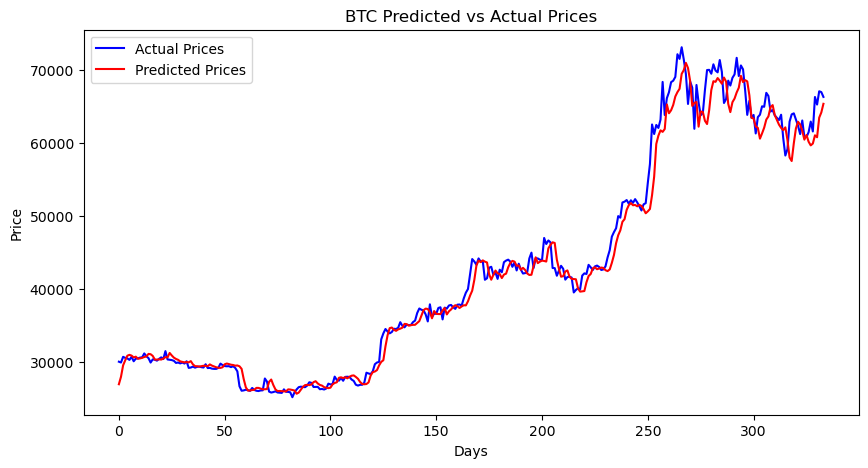

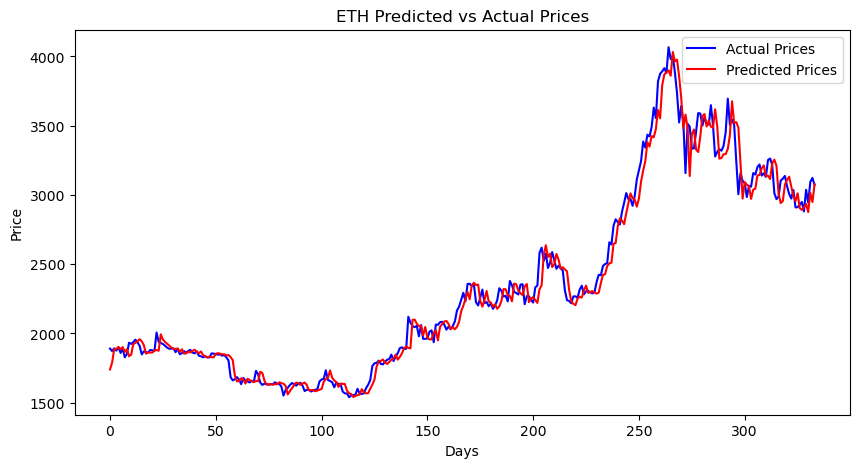

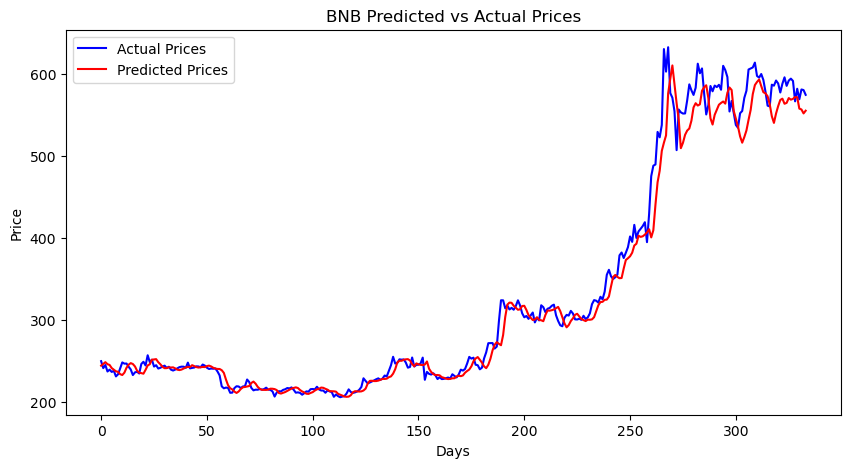

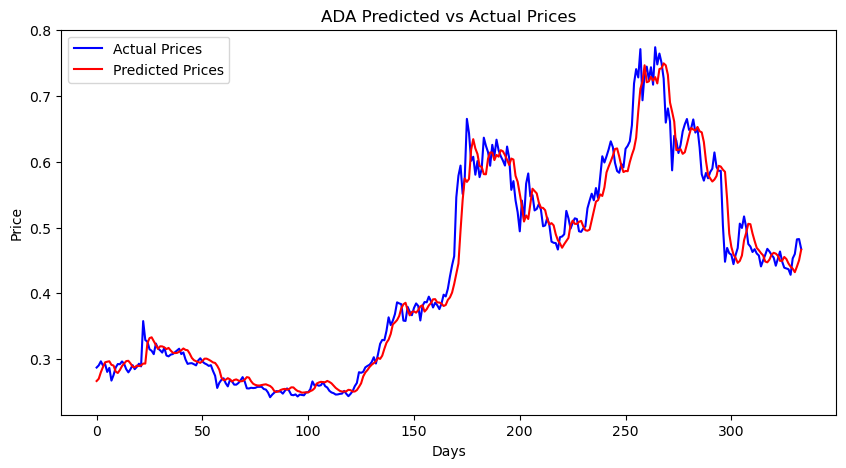

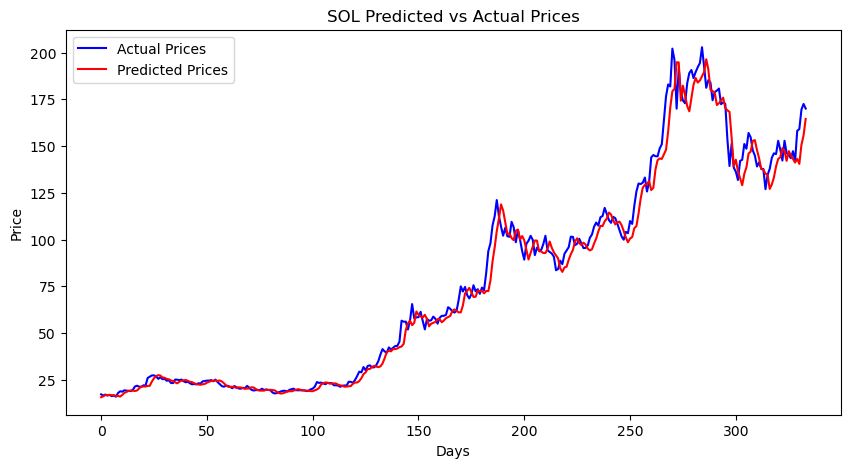

...

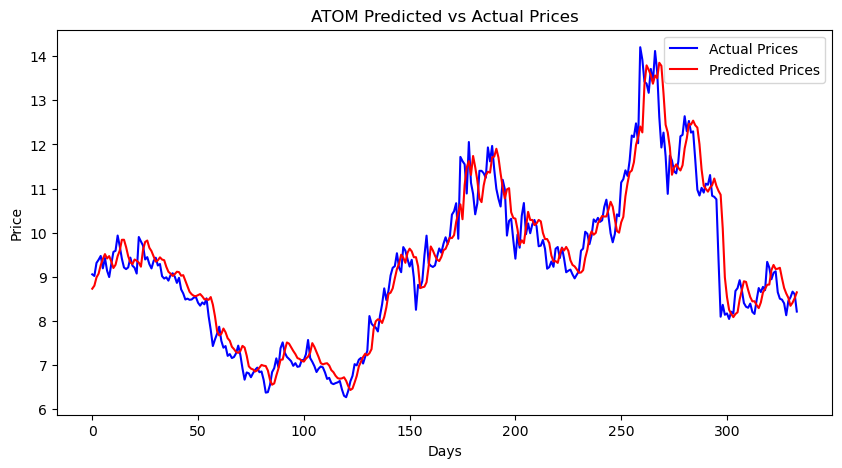

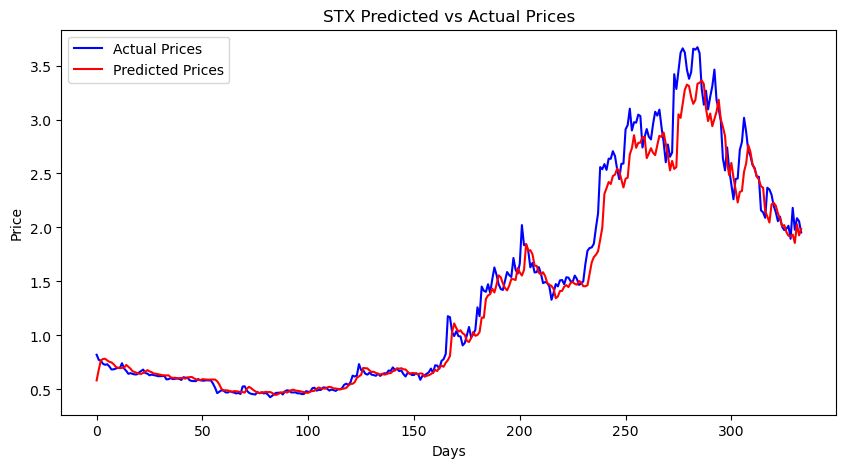

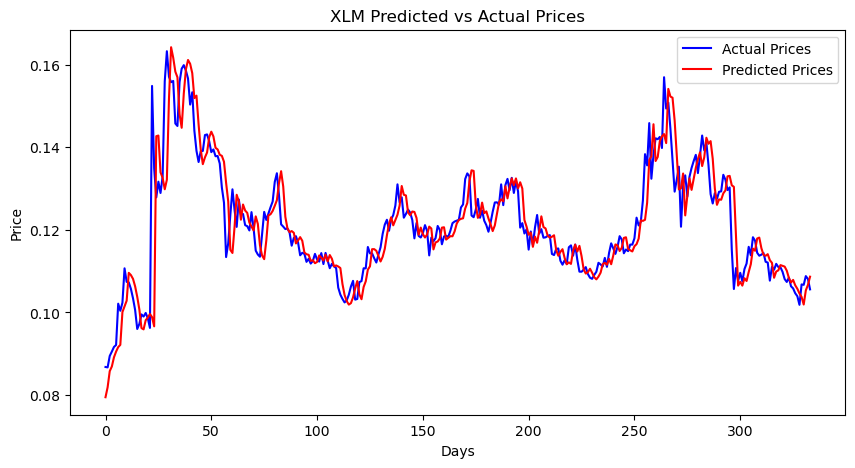

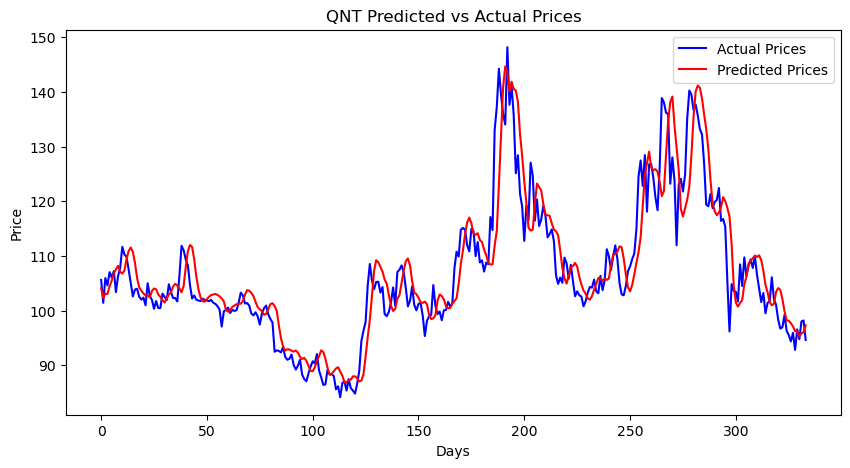

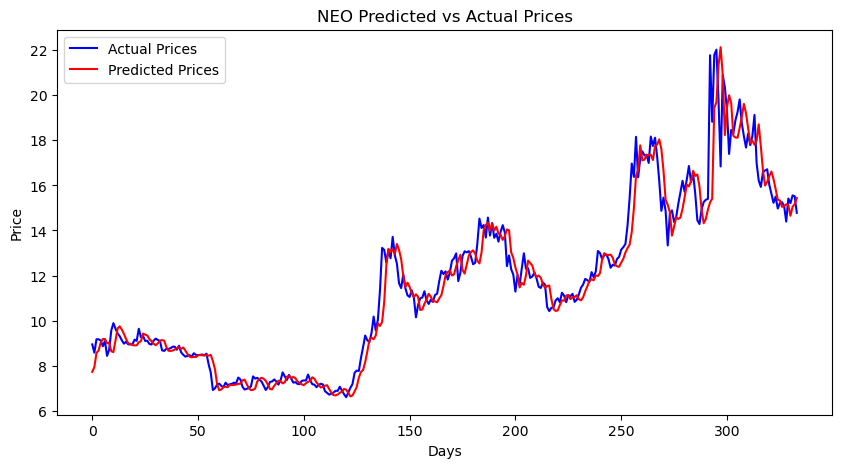

In [43]:
# Plotting predicted vs actual prices for each cryptocurrency
def plot_pred_vs_actual(predictions_df):
    for i, row in predictions_df.iterrows():
        crypto = row['crypto']
        actual_prices = row['actual_prices']
        predicted_prices = row['predicted_prices']
        
        plt.figure(figsize=(10, 5))
        plt.plot(actual_prices, label='Actual Prices', color='blue')
        plt.plot(predicted_prices, label='Predicted Prices', color='red')
        plt.title(f'{crypto} Predicted vs Actual Prices')
        plt.xlabel('Days')
        plt.ylabel('Price')
        plt.legend()
        plt.show()

plot_pred_vs_actual(predictions_df)

# 4. Correlation Analysis
Analyze the correlation between different cryptocurrencies.

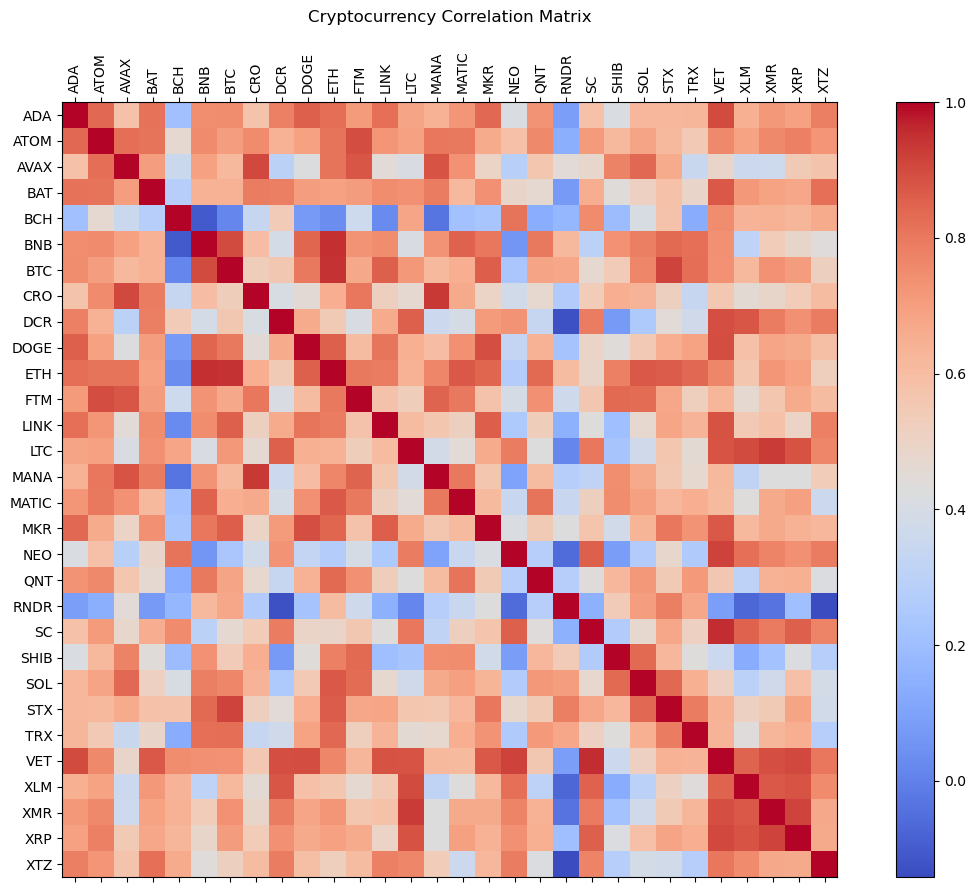

In [48]:
# Plotting correlation analysis
def plot_correlation_analysis(csv_file, cryptos):
    df_all = pd.read_csv(csv_file)
    correlation_matrix = df_all.pivot(index='Date', columns='Symbol', values='Close').corr()
    
    plt.figure(figsize=(15, 10))
    plt.matshow(correlation_matrix, cmap='coolwarm', fignum=1)
    plt.colorbar()
    plt.title('Cryptocurrency Correlation Matrix', pad=20)
    plt.xticks(range(len(correlation_matrix.columns)), correlation_matrix.columns, rotation=90)
    plt.yticks(range(len(correlation_matrix.columns)), correlation_matrix.columns)
    plt.show()

plot_correlation_analysis(csv_file, cryptos)

# 5. Prediction vs Test Plot

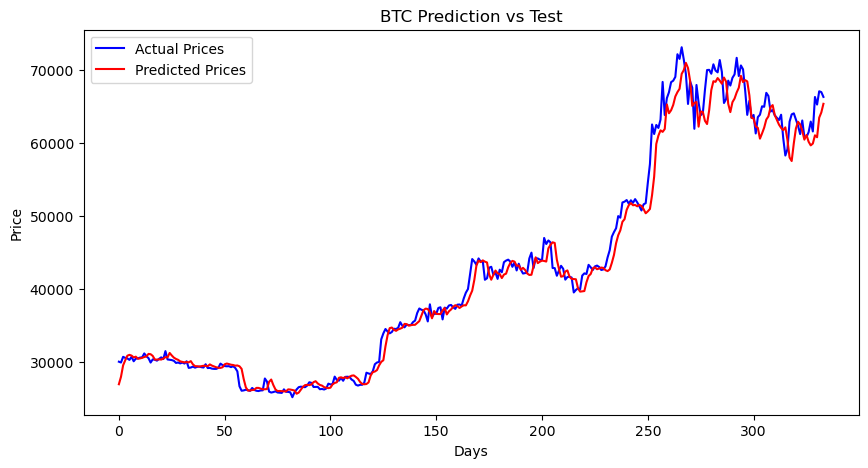

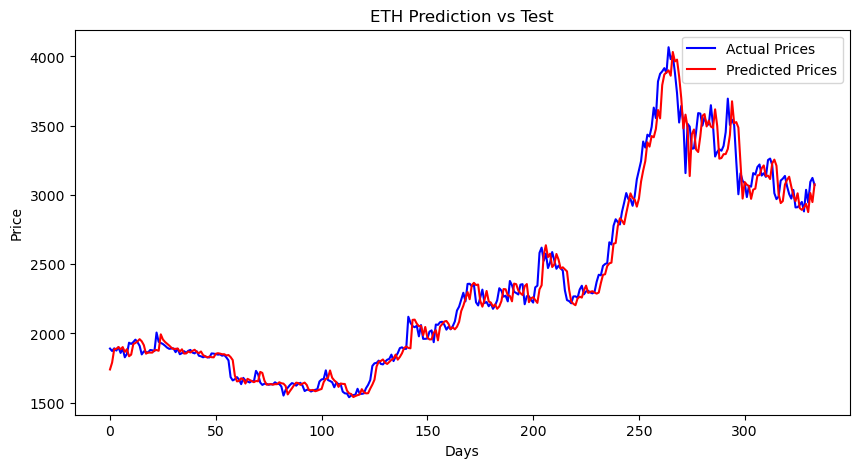

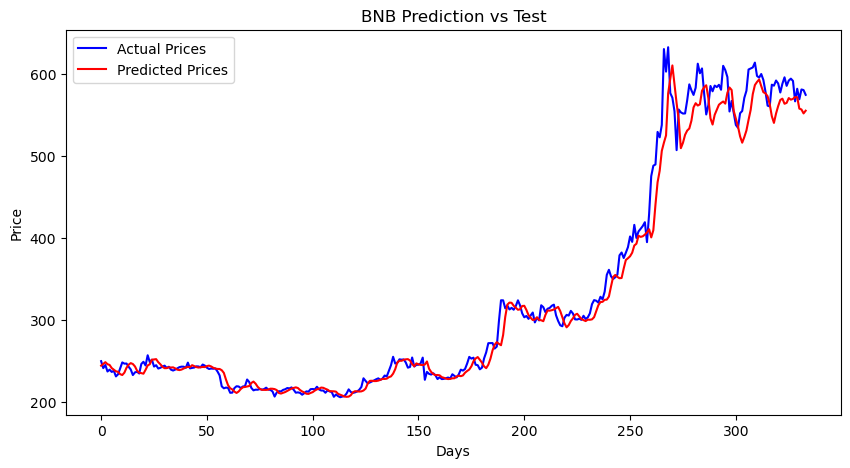

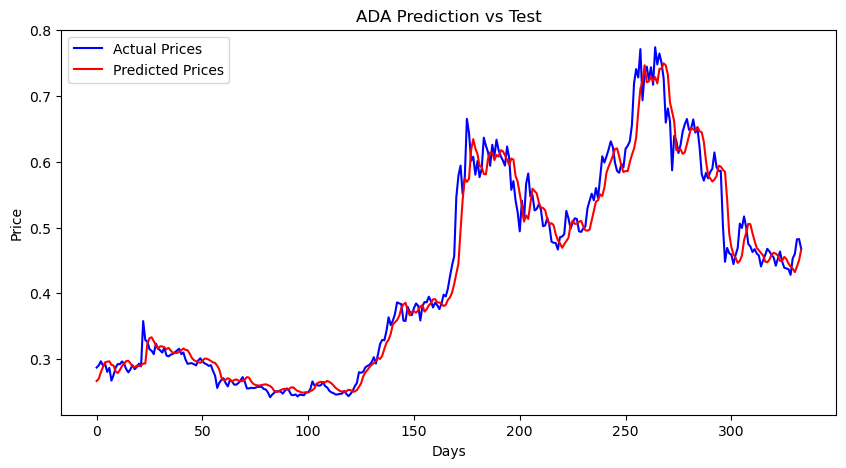

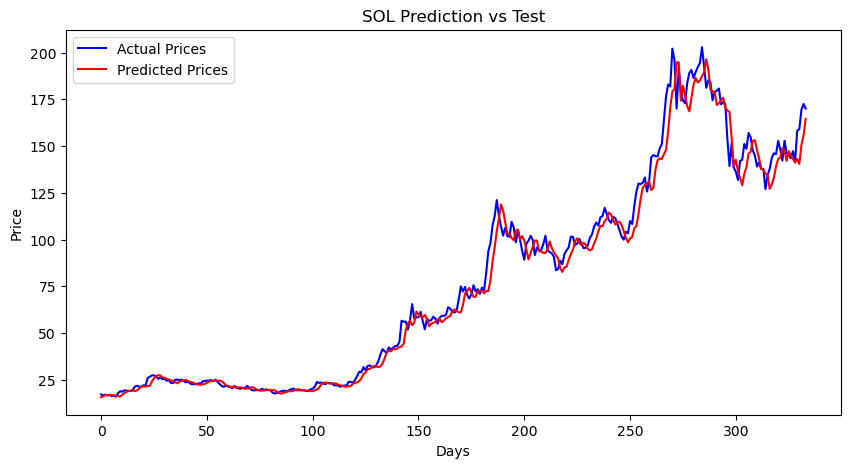

...

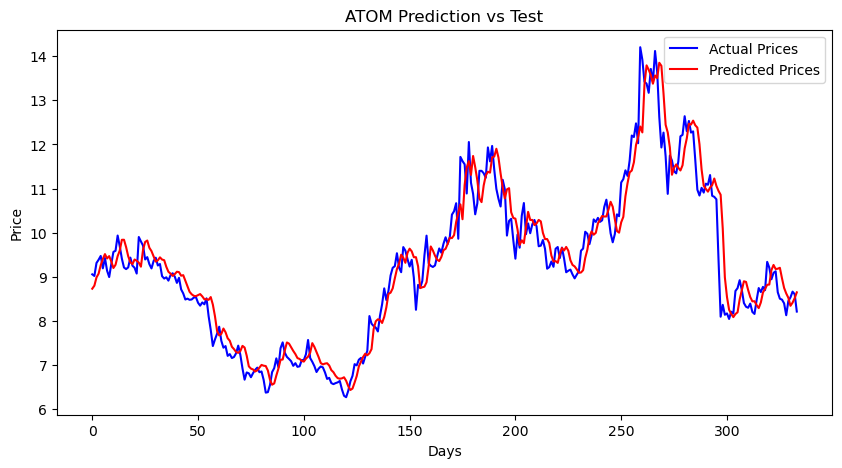

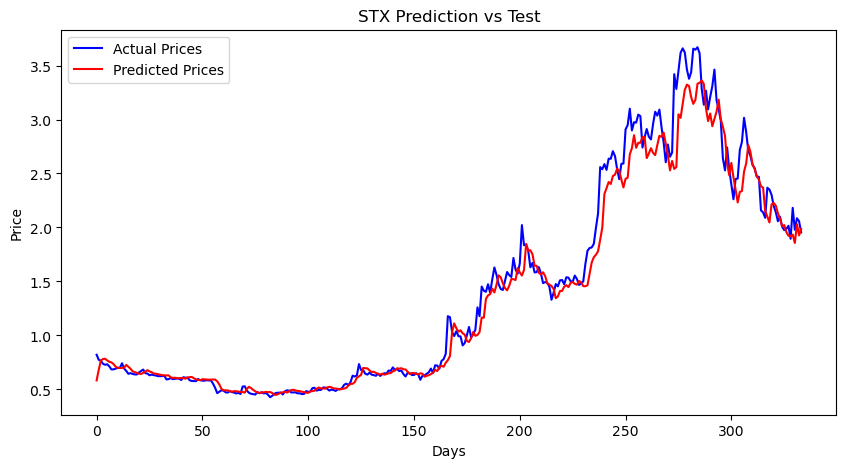

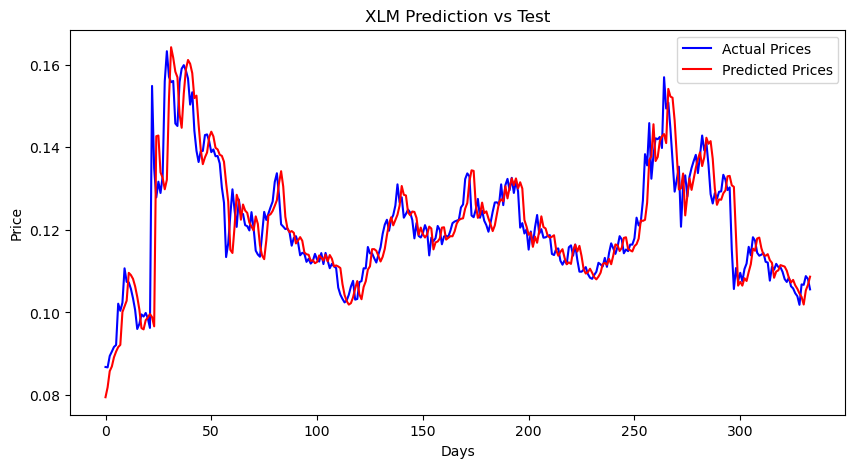

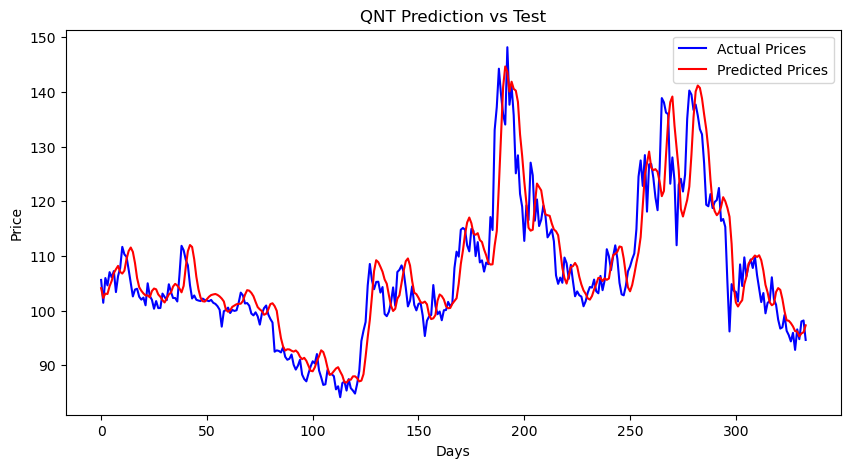

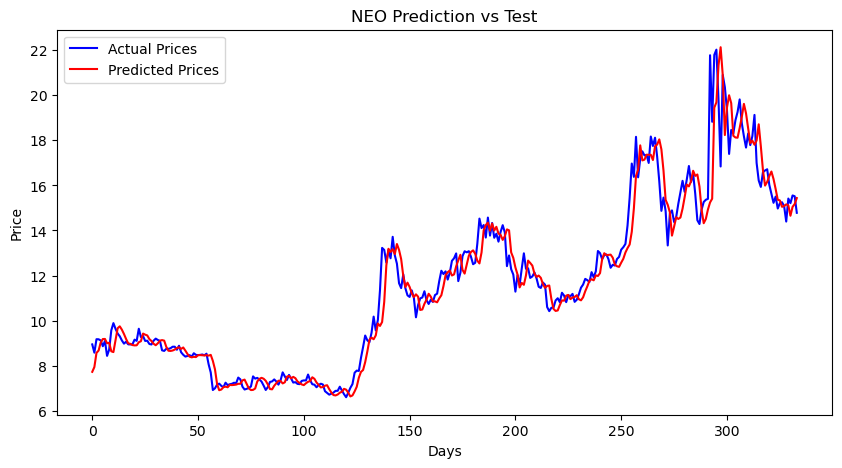

In [49]:
# Plotting prediction vs test
def plot_prediction_vs_test(predictions_df):
    for i, row in predictions_df.iterrows():
        crypto = row['crypto']
        actual_prices = row['actual_prices']
        predicted_prices = row['predicted_prices']
        
        plt.figure(figsize=(10, 5))
        plt.plot(actual_prices, label='Actual Prices', color='blue')
        plt.plot(predicted_prices, label='Predicted Prices', color='red')
        plt.title(f'{crypto} Prediction vs Test')
        plt.xlabel('Days')
        plt.ylabel('Price')
        plt.legend()
        plt.show()

plot_prediction_vs_test(predictions_df)

# Data Analysis

# Time Series Analysis for each Crypto

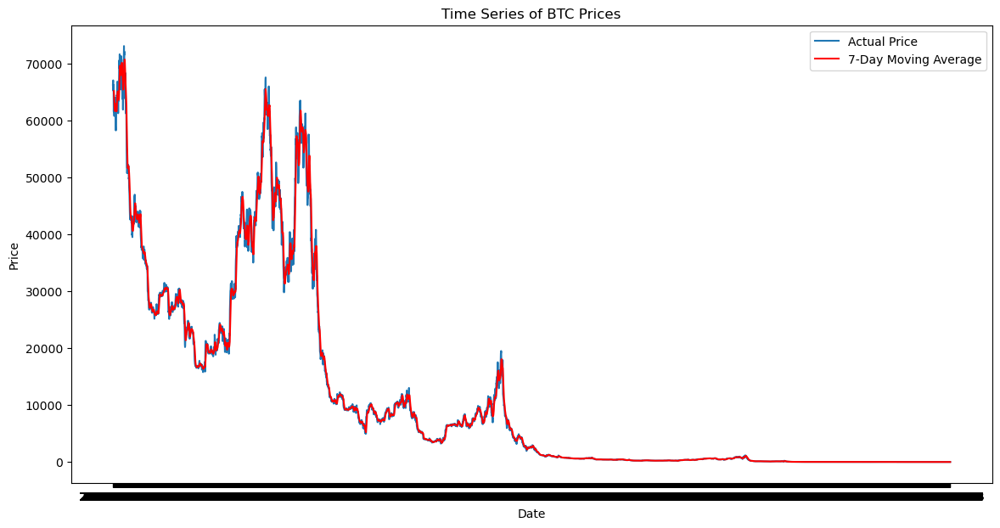

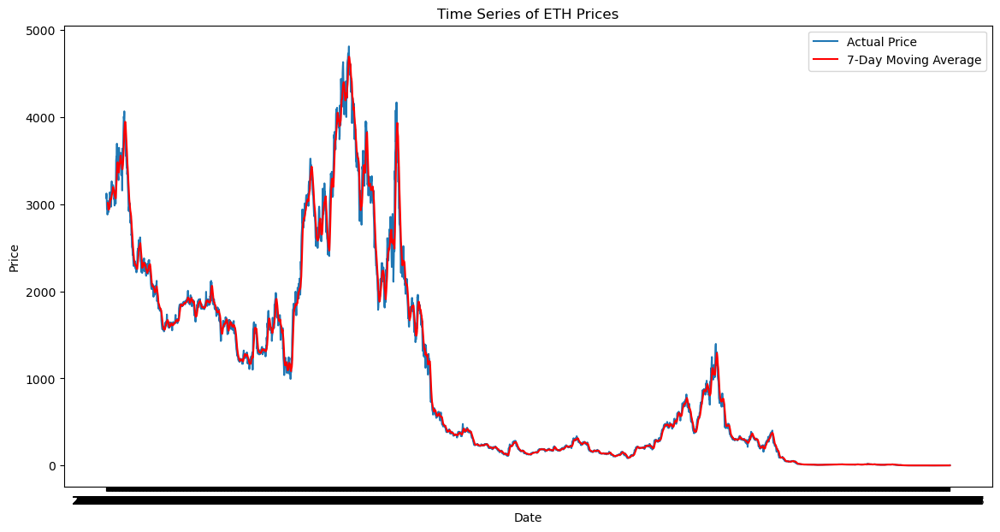

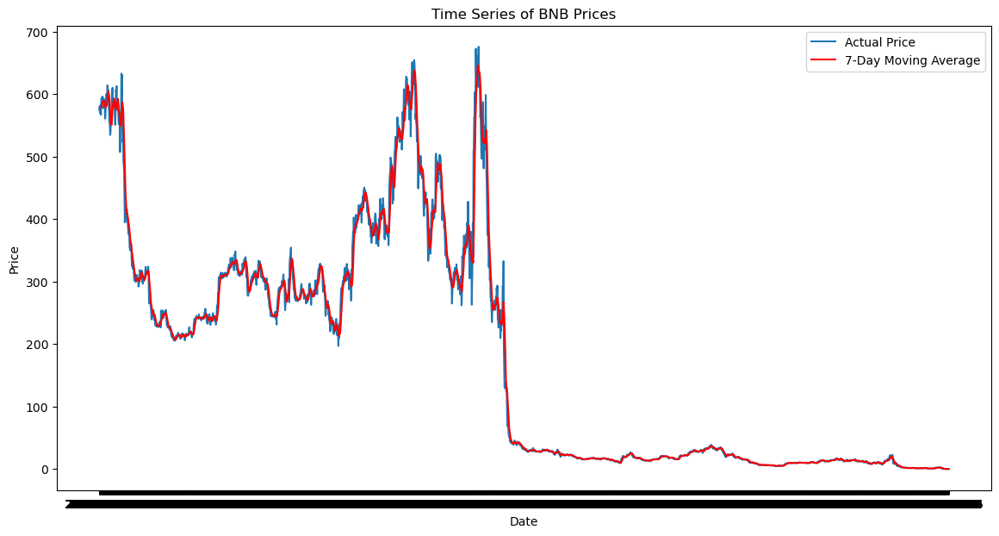

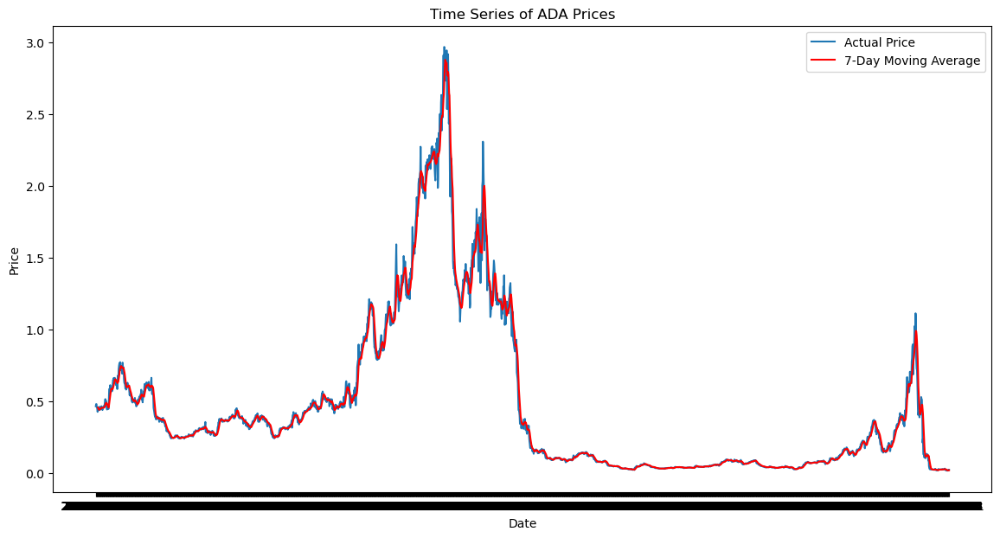

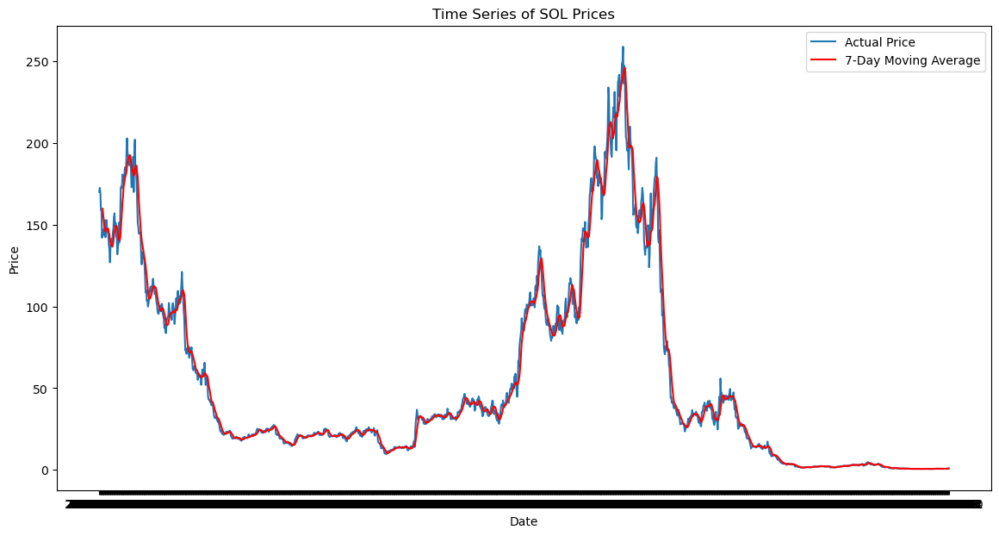

...

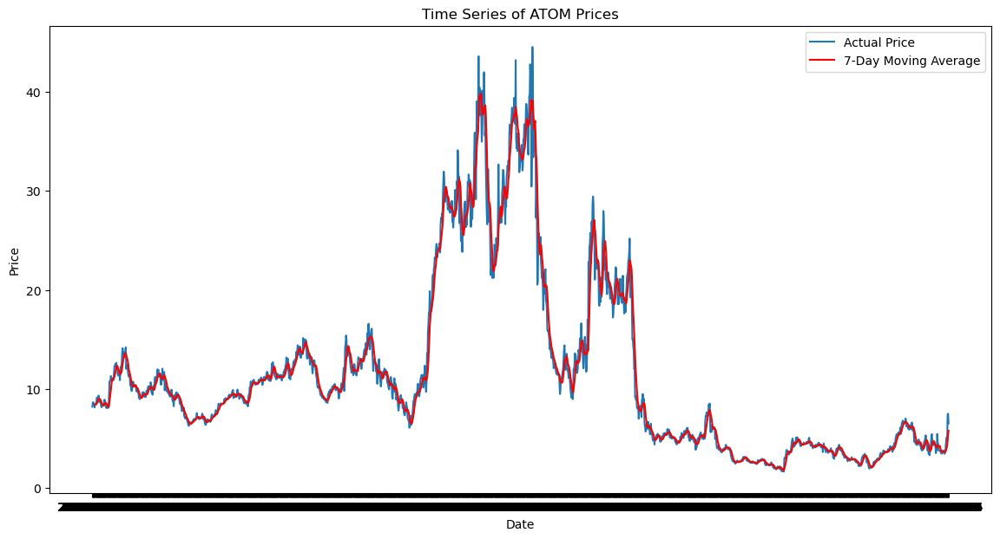

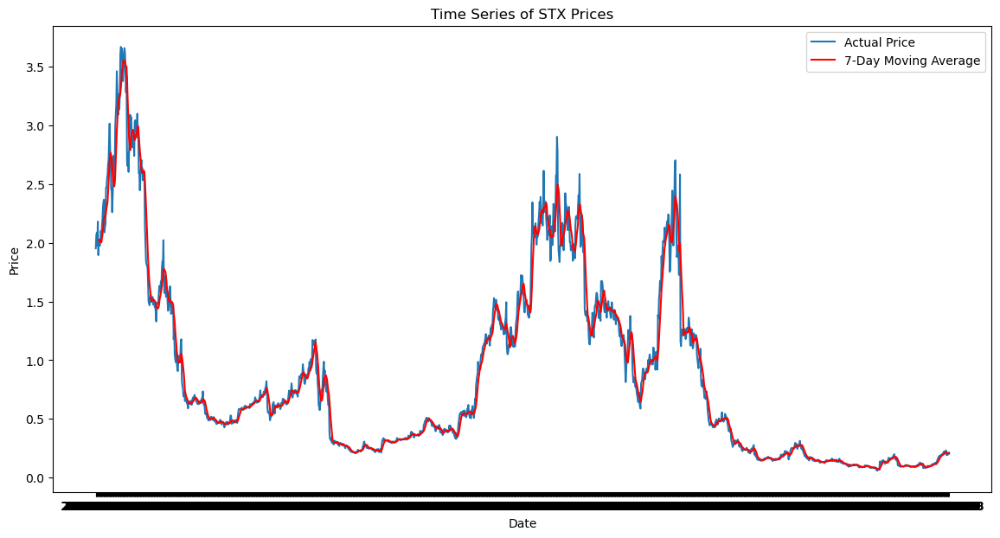

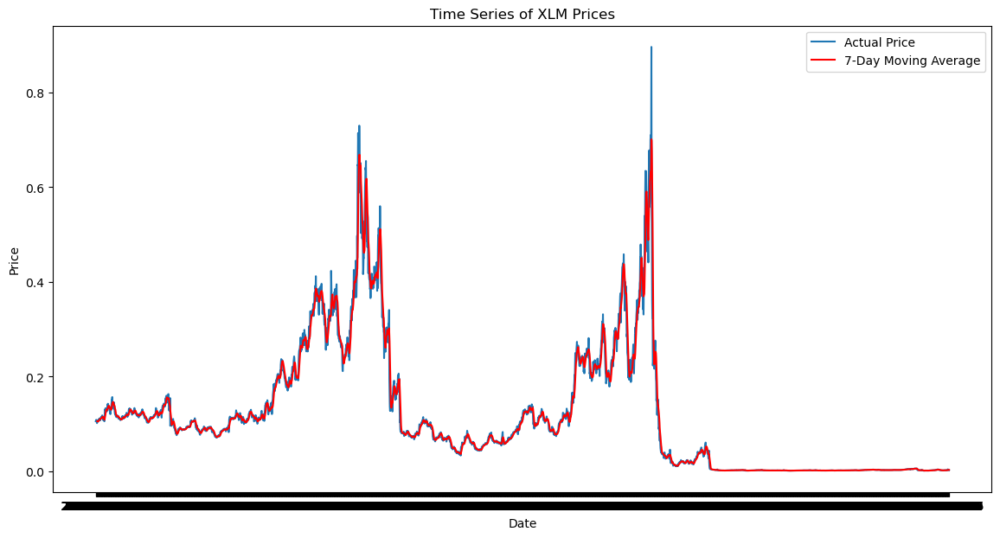

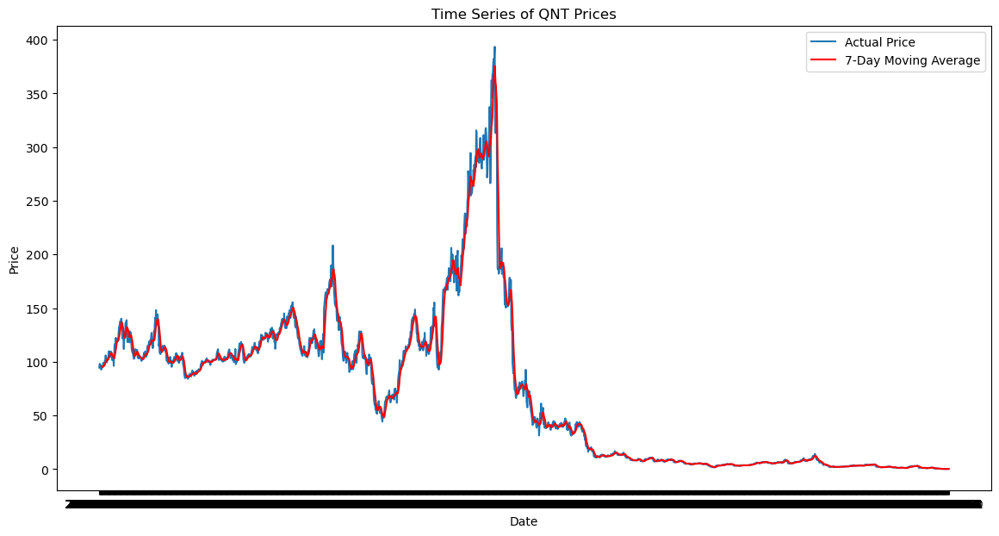

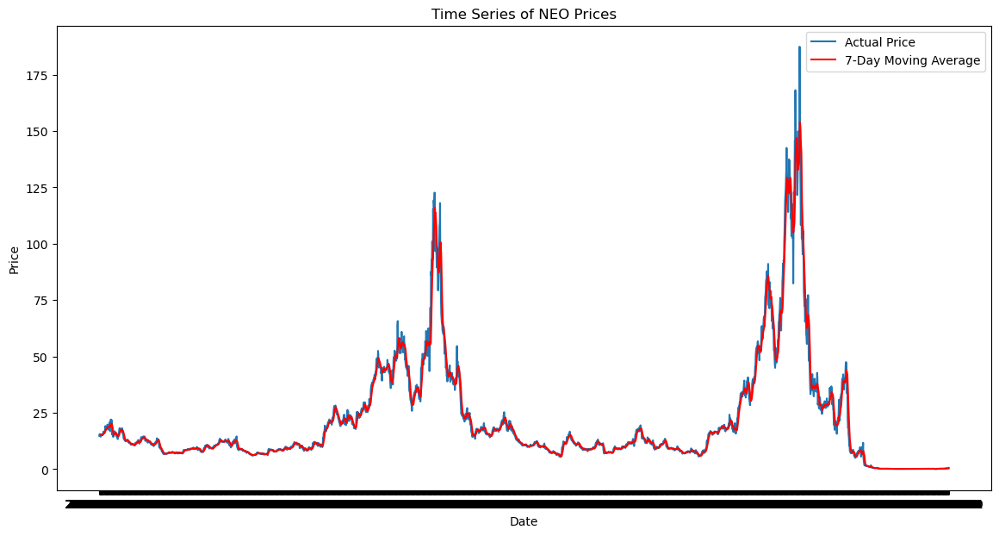

In [53]:
# Moving Average

# Ensure the 'Date' column is in datetime format
#datasets['Date'] = pd.to_datetime(datasets['Date'])

# List of unique cryptocurrencies
cryptos = datasets['Symbol'].unique()

# Moving Average Analysis for each cryptocurrency
for crypto in cryptos:
    crypto_data = datasets[datasets['Symbol'] == crypto]
    
    # Calculate Moving Average
    crypto_data['Close_MA'] = crypto_data['Close'].rolling(window=7).mean()
    
    # Visualization: Line Chart
    plt.figure(figsize=(14, 7))
    plt.plot(crypto_data['Date'], crypto_data['Close'], label='Actual Price')
    plt.plot(crypto_data['Date'], crypto_data['Close_MA'], label='7-Day Moving Average', color='red')
    plt.title(f'Time Series of {crypto} Prices')
    plt.xlabel('Date')
    plt.ylabel('Price')
    plt.legend()
    plt.show()

## 3D plot for Volume, Market Cap, and Price for each cryptocurrency

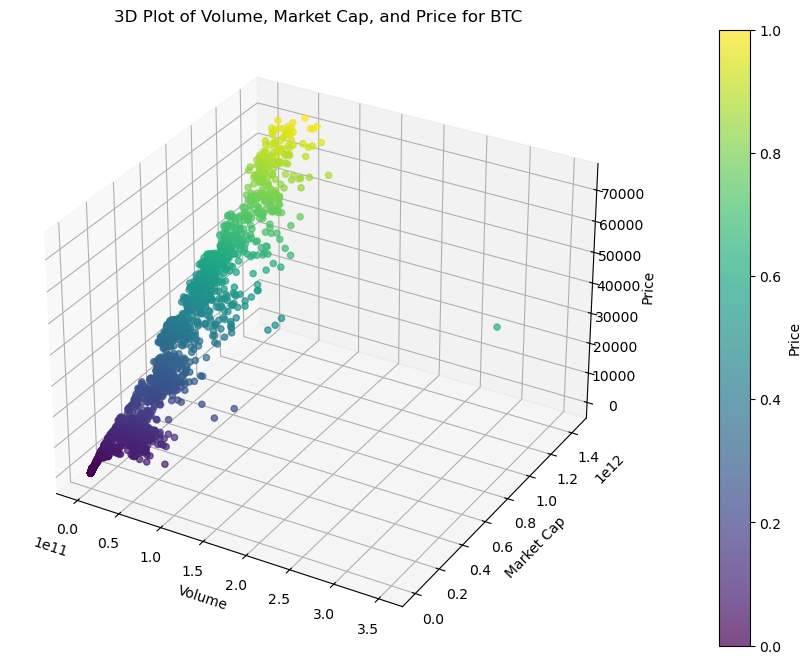

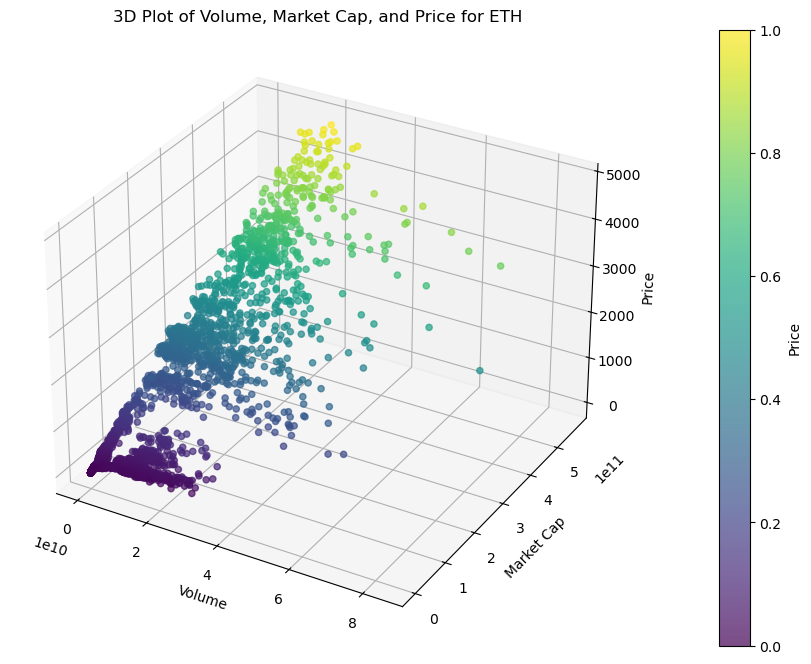

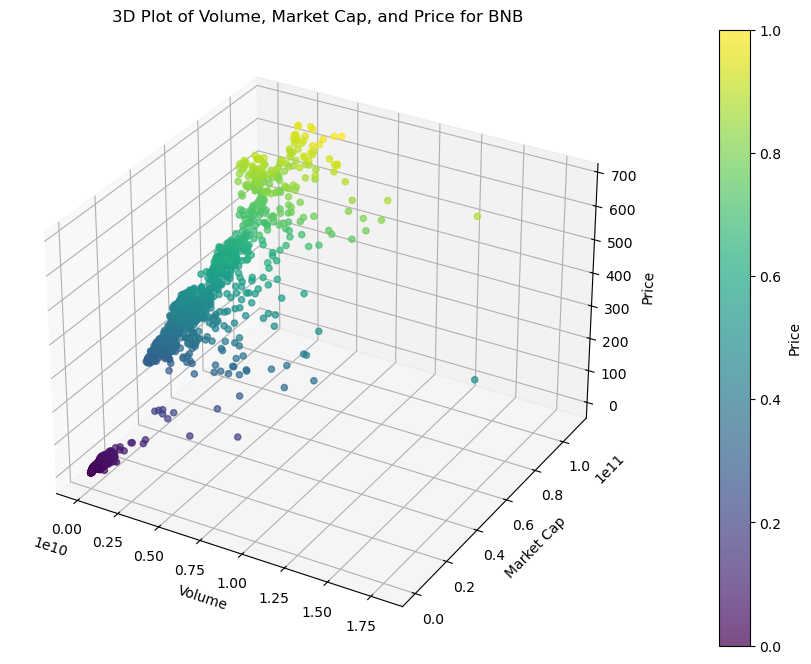

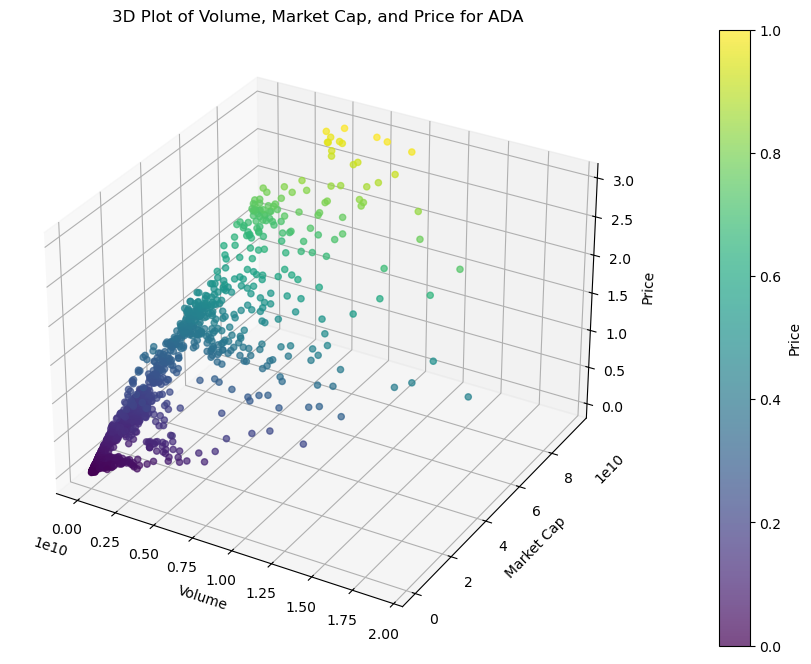

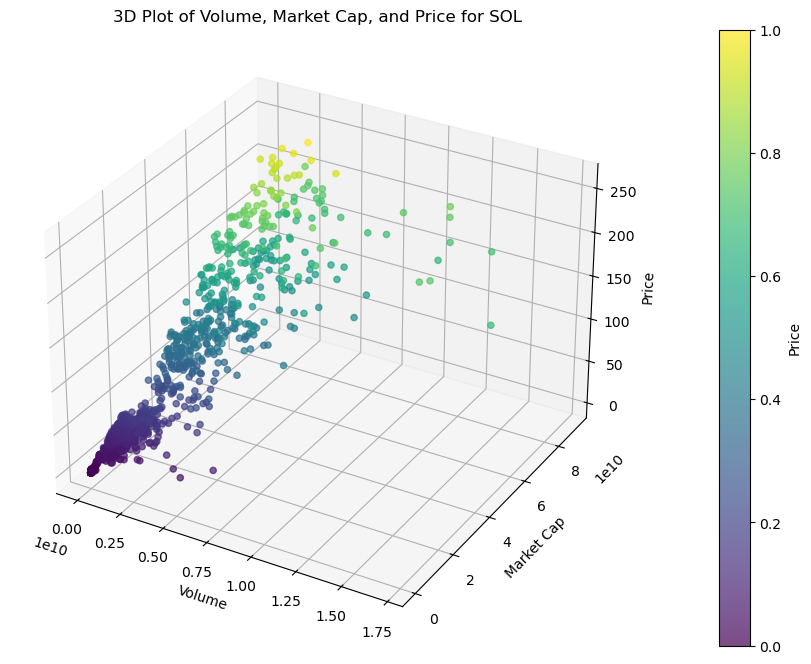

...

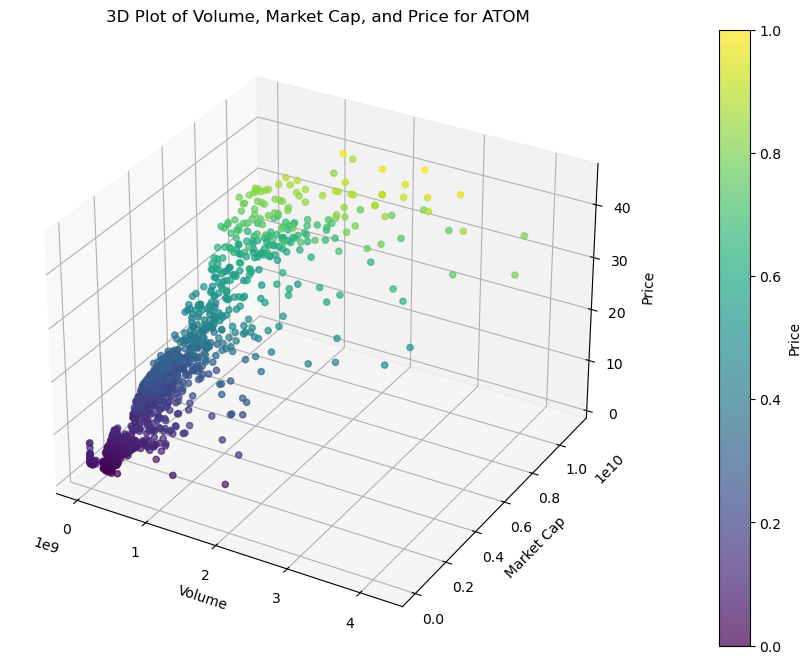

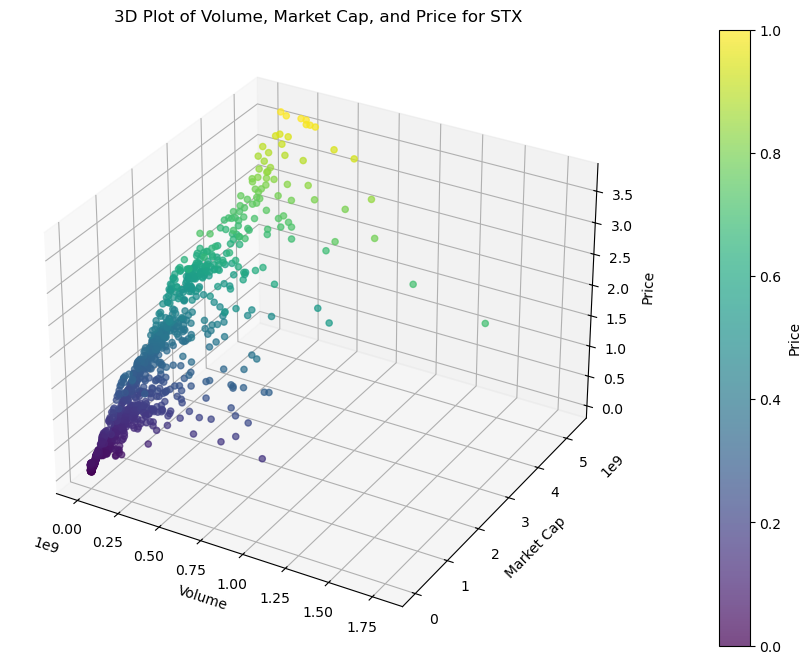

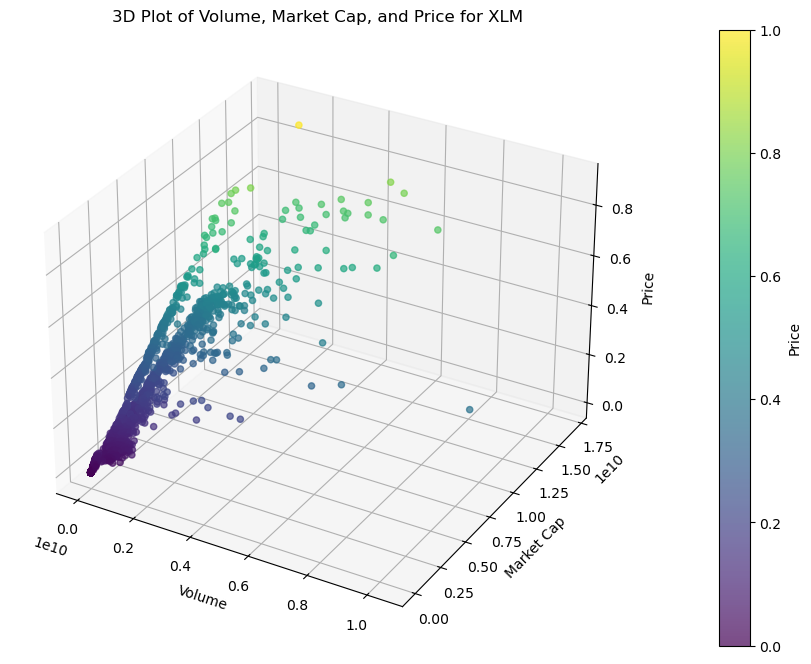

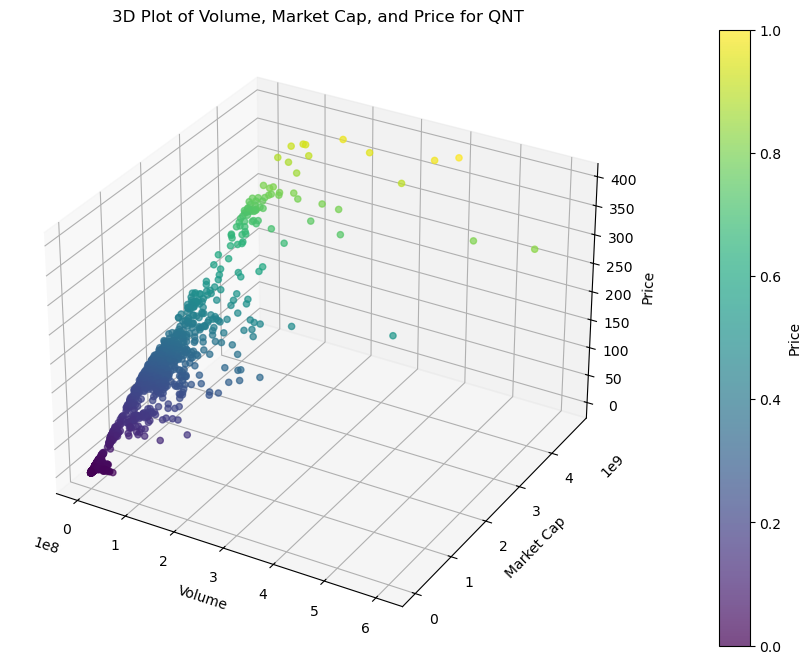

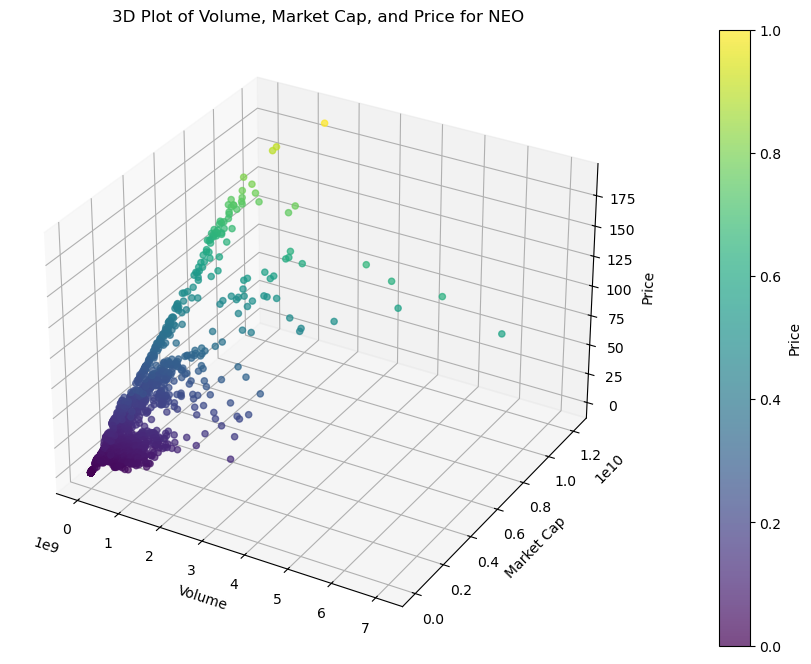

In [57]:
from mpl_toolkits.mplot3d import Axes3D
import numpy as np

# Function to normalize data for color mapping
def normalize(series):
    return (series - series.min()) / (series.max() - series.min())

# 3D Plot for Volume, Market Cap, and Price for each cryptocurrency
for crypto in cryptos:
    crypto_data = datasets[datasets['Symbol'] == crypto]
    
    fig = plt.figure(figsize=(12, 8))
    ax = fig.add_subplot(111, projection='3d')
    
    # Normalize data for coloring
    colors = plt.cm.viridis(normalize(crypto_data['Close']))
    
    scatter = ax.scatter(
        crypto_data['Volume'], 
        crypto_data['Market Cap'], 
        crypto_data['Close'], 
        c=colors, 
        marker='o', 
        alpha=0.7
    )

    ax.set_xlabel('Volume')
    ax.set_ylabel('Market Cap')
    ax.set_zlabel('Price')
    plt.title(f'3D Plot of Volume, Market Cap, and Price for {crypto}')
    
    # Add a color bar
    cbar = fig.colorbar(scatter, ax=ax, pad=0.1)
    cbar.set_label('Price')
    
    plt.show()

## correlation matrix

In [68]:
# Assuming 'historical_data' is the DataFrame containing all the data
earliest_dates = datasets.groupby('Symbol')['Date'].min()
print(earliest_dates)

Symbol
ADA     2017-10-01
ATOM    2019-03-14
AVAX    2020-07-13
BAT     2017-06-01
BCH     2017-07-23
BNB     2017-07-25
BTC     2010-07-13
CRO     2018-12-14
DCR     2016-02-10
DOGE    2013-12-15
ETH     2015-08-07
FTM     2018-10-30
LINK    2017-09-20
LTC     2013-04-28
MANA    2017-09-17
MATIC   2019-04-28
MKR     2017-01-29
NEO     2016-09-09
QNT     2018-08-10
RNDR    2020-06-11
SC      2015-08-26
SHIB    2020-08-01
SOL     2020-04-10
STX     2019-10-28
TRX     2017-09-13
VET     2018-08-03
XLM     2014-08-05
XMR     2014-05-21
XRP     2013-08-04
XTZ     2018-07-01
Name: Date, dtype: datetime64[ns]


In [69]:
earliest_common_date = earliest_dates.max()
print(f"The earliest common date for all cryptocurrencies is: {earliest_common_date}")

The earliest common date for all cryptocurrencies is: 2020-08-01 00:00:00


In [70]:
filtered_data = datasets[datasets['Date'] >= earliest_common_date]

In [71]:
# Pivot the filtered data
pivoted_data = filtered_data.pivot_table(index='Date', columns='Symbol', values='Close')

# Forward fill missing values
pivoted_data.fillna(method='ffill', inplace=True)

# Optionally, backfill if the first row still contains NaNs
pivoted_data.fillna(method='bfill', inplace=True)

# Save or continue to use the cleaned data
pivoted_data.to_csv('pivoted_selected_column_data.csv')
print(pivoted_data.head())

Symbol           ADA      ATOM      AVAX       BAT         BCH        BNB  \
Date                                                                        
2020-08-01  0.143573  4.063536  5.234632  0.257829  317.996473  21.530431   
2020-08-02  0.133505  3.891798  5.234632  0.242356  283.781996  20.944887   
2020-08-03  0.137335  3.854832  5.234632  0.251229  296.535253  22.055011   
2020-08-04  0.143018  4.010160  5.234632  0.261519  288.385859  22.282586   
2020-08-05  0.142695  4.159565  5.234632  0.257778  294.486645  23.336217   

Symbol               BTC       CRO        DCR      DOGE  ...        SC  \
Date                                                     ...             
2020-08-01  11759.592771  0.173408  17.041594  0.003689  ...  0.003280   
2020-08-02  11053.613901  0.163718  15.588548  0.003336  ...  0.003132   
2020-08-03  11246.348775  0.163104  16.671608  0.003389  ...  0.003141   
2020-08-04  11205.892918  0.156605  16.280851  0.003535  ...  0.003147   
2020-08-05  1174

In [73]:
merged_data[["Crypto", "Symbol"]]

,Crypto,Symbol
1,Bitcoin,BTC
2,Tezos,XTZ
3,Decentraland,MANA
4,Ethereum,ETH
5,Siacoin,SC
6,Basic Attention Token,BAT
7,Decred,DCR
8,BNB,BNB
9,Solana,SOL
10,XRP,XRP


# Exploratory Data Analysis for CryptoProphet Project

In [74]:
datasets.head

<bound method NDFrame.head of             Date          Open          High           Low         Close  \
0     2024-05-19  66937.930074  67694.298780  65937.177806  66278.370082   
1     2024-05-18  67066.211043  67387.330366  66663.496521  66940.804410   
2     2024-05-17  65231.298680  67459.459502  65119.314977  67051.874913   
3     2024-05-16  66256.111817  66712.429379  64613.056046  65231.580313   
4     2024-05-15  61553.989847  66454.449965  61330.408780  66267.491467   
...          ...           ...           ...           ...           ...   
77418 2016-09-13      0.374469      0.375092      0.301766      0.309509   
77419 2016-09-12      0.376312      0.376671      0.360443      0.374598   
77420 2016-09-11      0.390948      0.398459      0.372790      0.376150   
77421 2016-09-10      0.558536      0.559143      0.370960      0.391001   
77422 2016-09-09      0.181483      0.558951      0.181357      0.558478   

             Volume    Market Cap Symbol  Daily_Return  V

In [75]:
datasets.describe()

,Date,Open,High,Low,Close,Volume,Market Cap,Daily_Return,Volatility,Price_Change,Rolling_Mean,Rolling_Std,Cumulative_Return
count,77423,7.742300e+04,7.742300e+04,7.742300e+04,7.742300e+04,7.742300e+04,7.742300e+04,77393.000000,76523.000000,7.739300e+04,7.655300e+04,7.655300e+04,77393.000000
mean,2020-06-07 07:10:48.690957568,8.582119e+02,8.797725e+02,8.352335e+02,8.590746e+02,1.618126e+09,2.354131e+10,0.000829,0.057347,-9.472949e-01,8.552920e+02,6.692807e+01,-0.179422
min,2010-07-13 00:00:00,8.287425e-11,1.022099e-10,8.164606e-11,8.291969e-11,0.000000e+00,0.000000e+00,-0.983177,0.006850,-7.293022e+03,1.299677e-10,1.785076e-11,-0.999999
25%,2018-10-12 00:00:00,8.912955e-02,9.305195e-02,8.585194e-02,8.931087e-02,8.888434e+06,2.872794e+08,-0.025860,0.034922,-4.443899e-02,9.083658e-02,8.453161e-03,-0.904165
50%,2020-11-06 00:00:00,1.465227e+00,1.540388e+00,1.401037e+00,1.466493e+00,9.328892e+07,1.529455e+09,-0.000071,0.049196,-3.507683e-11,1.505206e+00,1.802609e-01,-0.493792
75%,2022-08-13 00:00:00,5.733404e+01,5.945933e+01,5.520311e+01,5.739704e+01,5.366258e+08,6.464280e+09,0.026164,0.068392,3.809217e-02,5.866572e+01,5.459610e+00,0.061707
max,2024-05-19 00:00:00,7.307937e+04,7.375007e+04,7.133409e+04,7.308350e+04,3.509679e+11,1.436272e+12,2.679846,0.537776,7.554039e+03,6.855535e+04,8.906455e+03,12.404356
std,NaN,5.136289e+03,5.257481e+03,5.004630e+03,5.141120e+03,6.149732e+09,1.037590e+11,0.069749,0.035760,1.833187e+02,5.080135e+03,4.153534e+02,1.120753


# Correction to get the best model for each crypto

In [2]:
import pandas as pd
import numpy as np
from sklearn.preprocessing import MinMaxScaler
from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score
from keras.models import Sequential, load_model
from keras.layers import LSTM, GRU, Bidirectional, Dense, Dropout
from keras.callbacks import EarlyStopping
import pickle
import os
import matplotlib.pyplot as plt

# List of cryptocurrency symbols
cryptos = ["BTC", "ETH", "BNB", "ADA", "SOL", "XRP", "LTC", "LINK", "DOGE", "SHIB",
           "MANA", "VET", "XMR", "BCH", "AVAX", "TRX", "MATIC", "CRO", "RNDR", "XTZ",
           "BAT", "SC", "FTM", "DCR", "MKR", "ATOM", "STX", "XLM", "QNT", "NEO"]

lookback = 30
test_days = 365

def get_historical_data(csv_file, crypto_symbol):
    try:
        df = pd.read_csv(csv_file)
        df = df[df['Symbol'] == crypto_symbol]
        df['Date'] = pd.to_datetime(df['Date'])
        df = df.sort_values(by='Date')  # Ensure data is sorted by date
        df['Close'] = df['Close'].astype(float)
        return df
    except Exception as e:
        print(f"Error fetching data for {crypto_symbol}: {e}")
        return None

def prepare_data(df, lookback, test_days):
    data = df[['Close']].values
    
    train_data = data[:-test_days]
    test_data = data[-test_days:]
    
    scaler = MinMaxScaler()
    train_scaled = scaler.fit_transform(train_data)
    test_scaled = scaler.transform(test_data)
    
    def create_sequences(data, lookback):
        X, y = [], []
        for i in range(len(data) - lookback - 1):
            X.append(data[i:i + lookback])
            y.append(data[i + lookback + 1])
        return np.array(X), np.array(y)
    
    X_train, y_train = create_sequences(train_scaled, lookback)
    X_test, y_test = create_sequences(test_scaled, lookback)
    
    return X_train, X_test, y_train, y_test, scaler

def build_and_train_model(model_type, X_train, y_train, X_val, y_val):
    model = Sequential()
    if model_type == 'LSTM':
        model.add(LSTM(50, activation='tanh', return_sequences=False, input_shape=(lookback, 1)))
    elif model_type == 'GRU':
        model.add(GRU(50, activation='tanh', return_sequences=False, input_shape=(lookback, 1)))
    elif model_type == 'Bi-LSTM':
        model.add(Bidirectional(LSTM(50, activation='tanh', return_sequences=False), input_shape=(lookback, 1)))
    model.add(Dropout(0.1))
    model.add(Dense(1))
    model.compile(optimizer='adam', loss='mse')

    early_stopping = EarlyStopping(monitor='val_loss', patience=10, restore_best_weights=True)

    history = model.fit(X_train, y_train, epochs=100, batch_size=32, validation_data=(X_val, y_val), 
                        verbose=1, callbacks=[early_stopping])
    
    val_loss = min(history.history['val_loss'])
    return model, val_loss

def train_and_save_models(csv_file, crypto):
    df = get_historical_data(csv_file, crypto)
    if df is None:
        return  # Skip this cryptocurrency if no data is available
    
    X_train, X_test, y_train, y_test, scaler = prepare_data(df, lookback, test_days)
    
    # Split train data into train and validation sets
    val_size = int(0.2 * len(X_train))
    X_val, y_val = X_train[-val_size:], y_train[-val_size:]
    X_train, y_train = X_train[:-val_size], y_train[:-val_size]
    
    model_lstm, val_loss_lstm = build_and_train_model('LSTM', X_train, y_train, X_val, y_val)
    model_gru, val_loss_gru = build_and_train_model('GRU', X_train, y_train, X_val, y_val)
    model_bilstm, val_loss_bilstm = build_and_train_model('Bi-LSTM', X_train, y_train, X_val, y_val)
    
    # Save models
    os.makedirs('../backend/models', exist_ok=True)
    os.makedirs('../backend/scalers', exist_ok=True)
    
    model_lstm.save(f'../backend/models/{crypto}_lstm.h5')
    model_gru.save(f'../backend/models/{crypto}_gru.h5')
    model_bilstm.save(f'../backend/models/{crypto}_bilstm.h5')
    
    # Save scaler and validation losses
    with open(f'../backend/scalers/{crypto}_scaler.pkl', 'wb') as f:
        pickle.dump({'scaler': scaler, 'val_losses': [val_loss_lstm, val_loss_gru, val_loss_bilstm]}, f)

def load_models_and_predict(csv_file, crypto, lookback, X_test, scaler):
    # Load models
    model_lstm = load_model(f'../backend/models/{crypto}_lstm.h5', compile=False)
    model_gru = load_model(f'../backend/models/{crypto}_gru.h5', compile=False)
    model_bilstm = load_model(f'../backend/models/{crypto}_bilstm.h5', compile=False)
    
    # Load validation losses
    with open(f'../backend/scalers/{crypto}_scaler.pkl', 'rb') as f:
        data = pickle.load(f)
        val_losses = data['val_losses']
    
    # Determine the best model
    best_model_index = np.argmin(val_losses)
    models = [model_lstm, model_gru, model_bilstm]
    best_model = models[best_model_index]
    best_model_type = ['LSTM', 'GRU', 'Bi-LSTM'][best_model_index]
    
    # Make predictions with the best model
    predictions_scaled = best_model.predict(X_test)
    
    # Inverse scale the predictions
    predictions = scaler.inverse_transform(predictions_scaled)
    
    return predictions, best_model_type

def mean_absolute_percentage_error(y_true, y_pred):
    y_true, y_pred = np.array(y_true), np.array(y_pred)
    return np.mean(np.abs((y_true - y_pred) / y_true)) * 100

In [3]:
# Path to the CSV file containing historical data
csv_file = 'selected_column_data.csv'

# Train and save models for all cryptocurrencies
for crypto in cryptos:
    train_and_save_models(csv_file, crypto)

# Prediction for all cryptocurrencies for the test period
predictions = []
metrics = []

for crypto in cryptos:
    df = get_historical_data(csv_file, crypto)
    if df is None:
        continue  # Skip this cryptocurrency if no data is available
    
    X_train, X_test, y_train, y_test, scaler = prepare_data(df, lookback, test_days)
    y_test = scaler.inverse_transform(y_test)  # Inverse scale the actual values
    predicted_prices, best_model_type = load_models_and_predict(csv_file, crypto, lookback, X_test, scaler)
    
    predictions.append({'crypto': crypto, 'actual_prices': y_test.flatten(), 'predicted_prices': predicted_prices.flatten(), 'model_type': best_model_type})

    # Calculate metrics
    mae = mean_absolute_error(y_test, predicted_prices)
    mse = mean_squared_error(y_test, predicted_prices)
    rmse = np.sqrt(mse)
    mape = mean_absolute_percentage_error(y_test, predicted_prices)
    r2 = r2_score(y_test, predicted_prices)
    
    metrics.append({
        'crypto': crypto,
        'model_type': best_model_type,
        'MAE': mae,
        'MSE': mse,
        'RMSE': rmse,
        'MAPE (%)': mape,
        'R2': r2
    })

# Save predictions to a DataFrame
predictions_df = pd.DataFrame(predictions)
metrics_df = pd.DataFrame(metrics)

# Save to a CSV file
predictions_df.to_csv('crypto_predictions_3.csv', index=False)
metrics_df.to_csv('crypto_metrics_3.csv', index=False)

print(metrics_df)

Error fetching data for BTC: [Errno 2] No such file or directory: 'selected_column_data.csv'
Error fetching data for ETH: [Errno 2] No such file or directory: 'selected_column_data.csv'
Error fetching data for BNB: [Errno 2] No such file or directory: 'selected_column_data.csv'
Error fetching data for ADA: [Errno 2] No such file or directory: 'selected_column_data.csv'
Error fetching data for SOL: [Errno 2] No such file or directory: 'selected_column_data.csv'
Error fetching data for XRP: [Errno 2] No such file or directory: 'selected_column_data.csv'
Error fetching data for LTC: [Errno 2] No such file or directory: 'selected_column_data.csv'
Error fetching data for LINK: [Errno 2] No such file or directory: 'selected_column_data.csv'
Error fetching data for DOGE: [Errno 2] No such file or directory: 'selected_column_data.csv'
Error fetching data for SHIB: [Errno 2] No such file or directory: 'selected_column_data.csv'
Error fetching data for MANA: [Errno 2] No such file or directory: 

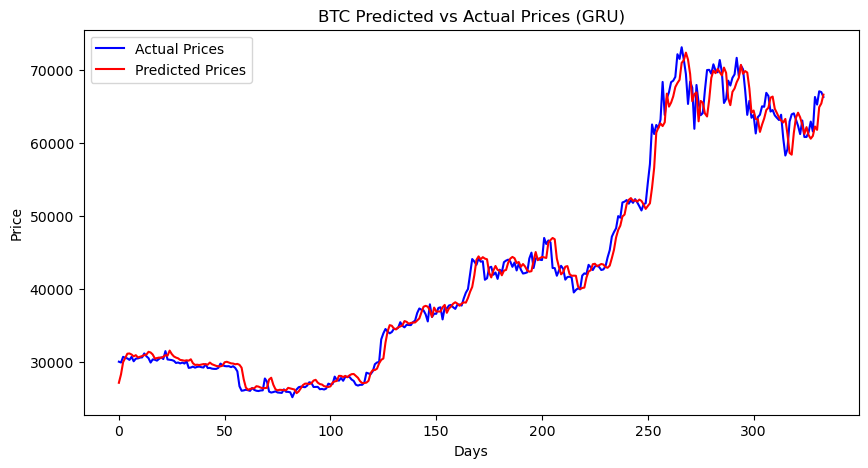

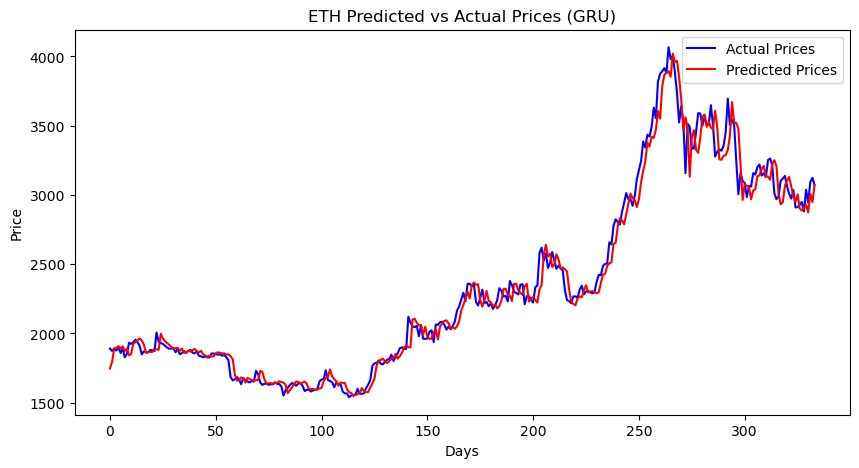

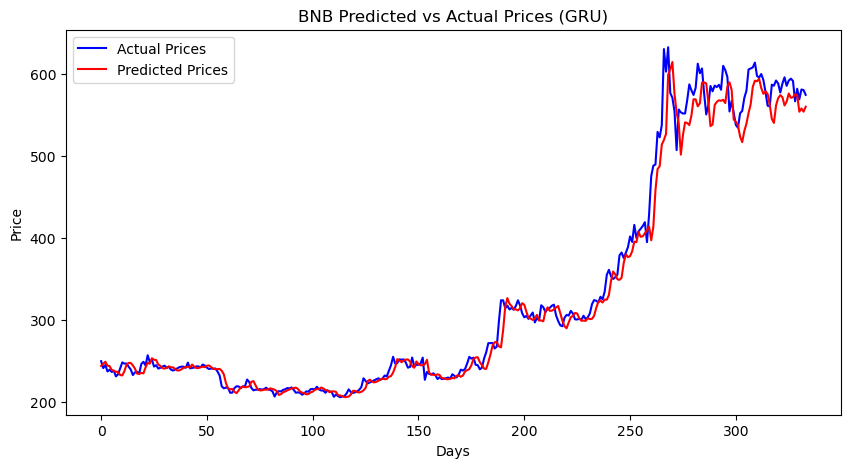

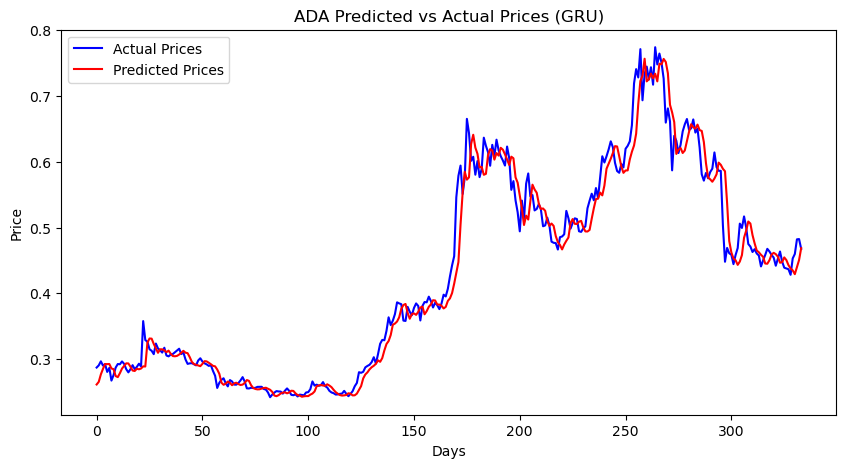

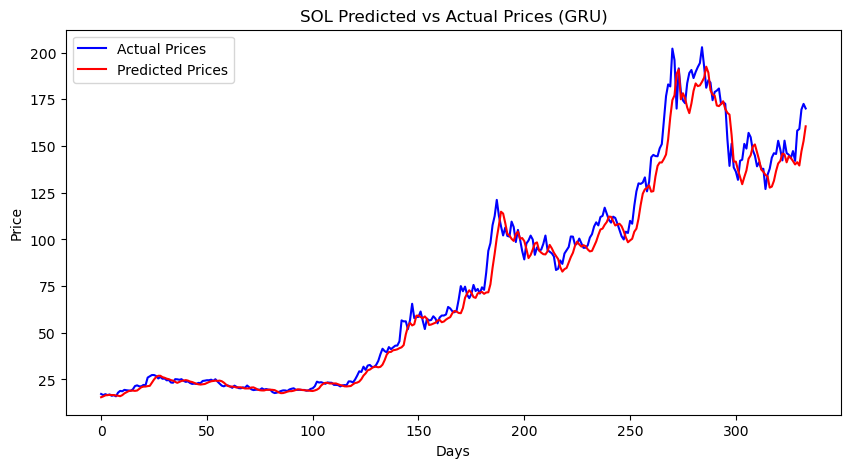

...

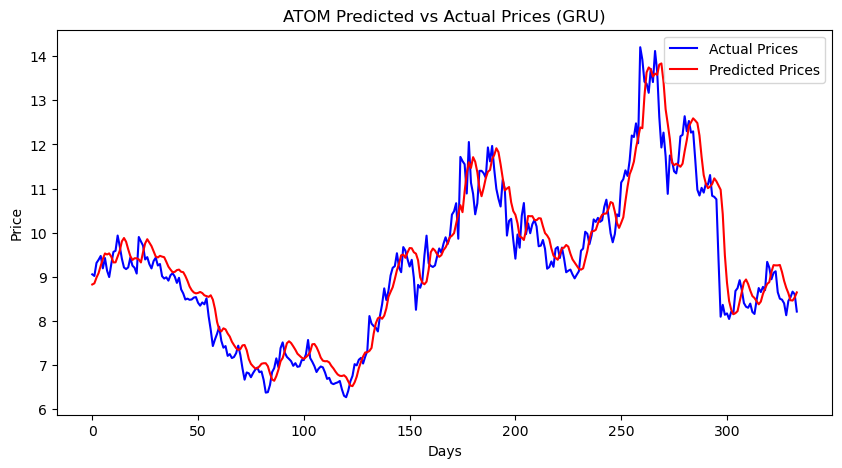

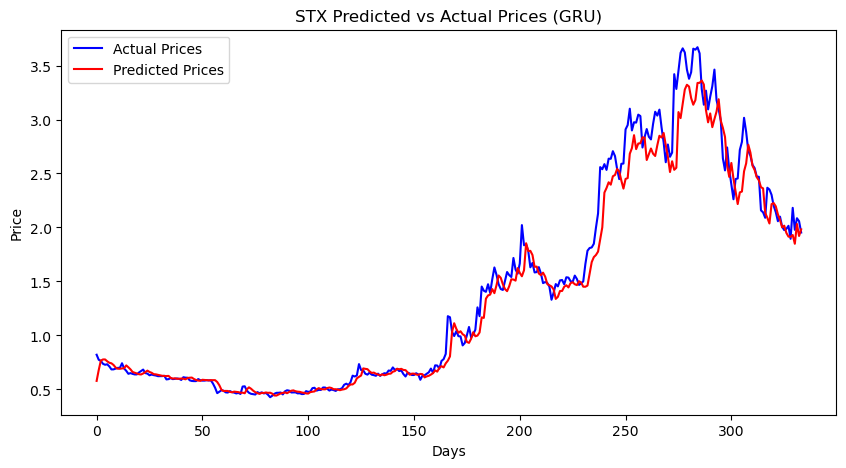

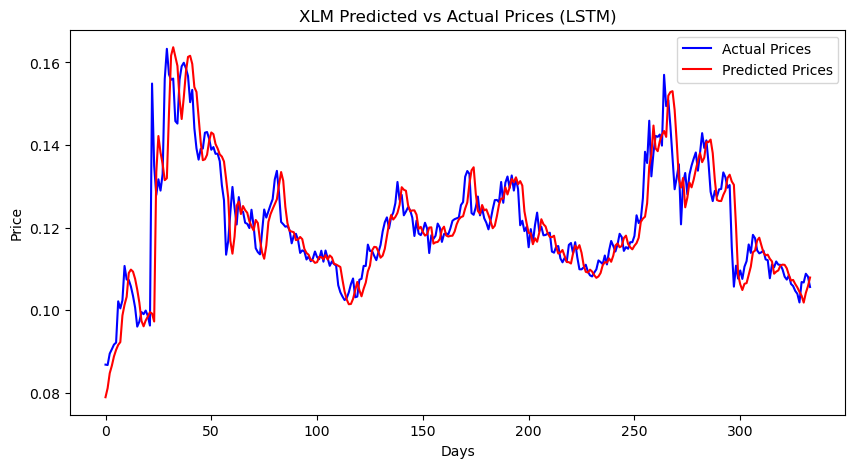

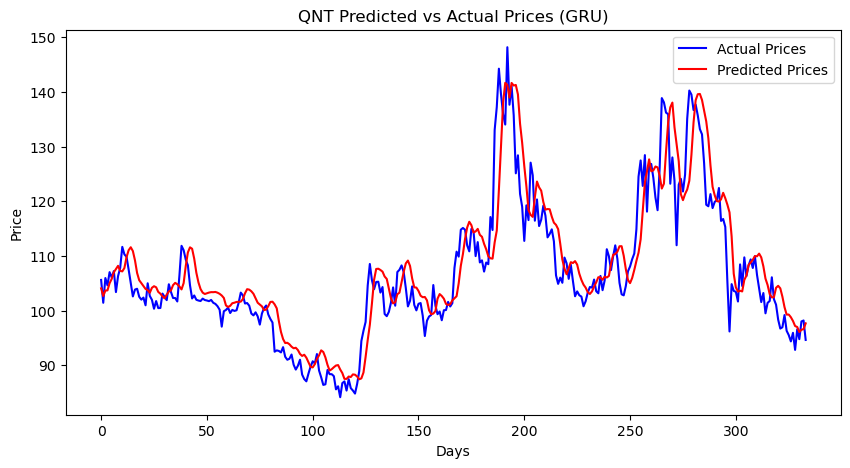

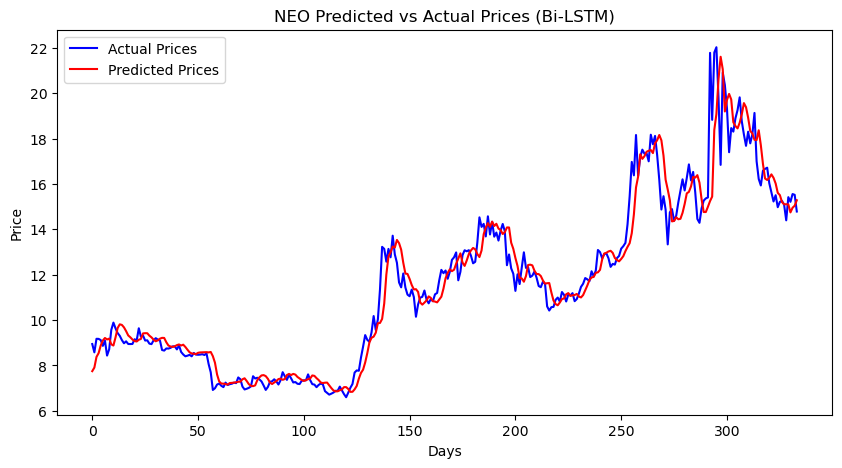

In [80]:
# Plotting predicted vs actual prices for each cryptocurrency
def plot_pred_vs_actual(predictions_df):
    for i, row in predictions_df.iterrows():
        crypto = row['crypto']
        actual_prices = row['actual_prices']
        predicted_prices = row['predicted_prices']
        model_type = row['model_type']
        
        plt.figure(figsize=(10, 5))
        plt.plot(actual_prices, label='Actual Prices', color='blue')
        plt.plot(predicted_prices, label='Predicted Prices',
                 color='red')
        plt.title(f'{crypto} Predicted vs Actual Prices ({model_type})')  # Include model type in the title
        plt.xlabel('Days')
        plt.ylabel('Price')
        plt.legend()
        plt.show()

plot_pred_vs_actual(predictions_df)